# IsoLearner

In [2]:
import tensorflow as tf
import isotopolouge_imputer as imputer
import visualization as vis
import importlib
import IsoLearner
importlib.reload(imputer)
importlib.reload(vis)
importlib.reload(IsoLearner)
import numpy as np

%reload_ext autoreload
%autoreload 2
# /Users/bisramr/tensorflow-metal/bin/python3

## Black Box Feature Evaluation

In [2]:
from black_box_features import *

In [5]:
metabolites = ["Taurodeoxycholic acid", "Glycocholic acid", "AMP"]
short_metabs, short_isos = Brain_3HB_IsoLearner.black_box_feature_evaluation(metabolites = metabolites)

['Taurodeoxycholic acid', 'Glycocholic acid', 'AMP']
Glycocholic acid m+00
['Glycocholic acid m+00', 'Glycocholic acid m+01', 'Glycocholic acid m+02', 'Glycocholic acid m+03', 'Glycocholic acid m+04', 'Glycocholic acid m+05', 'Glycocholic acid m+06', 'Glycocholic acid m+07', 'Glycocholic acid m+08', 'Glycocholic acid m+09', 'Glycocholic acid m+10', 'Glycocholic acid m+11', 'Glycocholic acid m+12', 'Glycocholic acid m+13', 'Glycocholic acid m+14', 'Glycocholic acid m+15', 'Glycocholic acid m+16', 'Glycocholic acid m+17', 'Glycocholic acid m+18', 'Glycocholic acid m+19', 'Glycocholic acid m+20', 'Glycocholic acid m+21', 'Glycocholic acid m+22', 'Glycocholic acid m+23', 'Glycocholic acid m+24', 'Glycocholic acid m+25', 'Glycocholic acid m+26', 'AMP m+00', 'AMP m+01', 'AMP m+02', 'AMP m+03', 'AMP m+04', 'AMP m+05', 'AMP m+06', 'AMP m+07', 'AMP m+08', 'AMP m+09', 'AMP m+10', 'Taurodeoxycholic acid m+00', 'Taurodeoxycholic acid m+01', 'Taurodeoxycholic acid m+04', 'Taurodeoxycholic acid m+05

In [14]:
# Example Implementation: 
# ===========================================================
print("Starting GCM Calculations") 
num_cols = len(metabolites)
mutation_index = 0
gcm_output = [None] * num_cols # np.fromiter(np.zeros(num_cols), dtype=float)

all_mutations = short_metabs.astype(float)  # The features (metabolites) that are being considered
Y_data = short_isos.astype(float) # The targets (isotopologues)

# all_mutations = expanded_df.iloc[:, 9:].astype(float) # -> All Mutations We are Testing Over
# Y_data = expanded_df.iloc[:,0:8].astype(float)

y_data = Y_data.values # -> Outputs don't change over the various features we are testing. 
print(f'Y data shape: {y_data.shape}')

while mutation_index < num_cols: # -> Per Mutation (feature)
    print(mutation_index)
    X_data = (all_mutations.iloc[:,mutation_index]).values.reshape(-1,1)
    print(X_data.shape)
    
    #Calculate marginal p_values and if any of the columns of Y 
    # If there's zero correlation, we know there will be no dependence --> ask wes about this
    #r, p_value = pearsonr(X_data, y_data) # -> Skip any features or mutations that don't matter
    #if p_value < 0.05: 
    Z_data = all_mutations.drop(all_mutations.columns[mutation_index], axis=1)
    print(Z_data.shape)

    if False:
        # Get just the top 100 PCs as a quick sub for Z -> wanted to reduce calculations, PCA helps prevent overfitting
        pca = PCA(n_components=5) # -> PCA Decomposition to help reduce dimensionality and reduce overfitting by the models. 
        pca.fit(Z_data.T)
        pca_Z_data = pca.components_.T
    
    test_mutation_results = multi_gcm_test(X_data, y_data, Z_data, IsoLearner.NeuralNetRegressorX, IsoLearner.NeuralNetRegressorY) # -> Calling the actual test mutation method
    gcm_output[mutation_index] = test_mutation_results #p_value -> Saving Pvalue Results
    #else: 
    #    gcm_output[mutation_index] = 1

    if mutation_index % 50 == 0:
        print(mutation_index)
        #if gcm_output[mutation_index] < 1:
        #    print(gcm_output[mutation_index])
    mutation_index += 1

print("Finished")

Starting GCM Calculations
Y data shape: (123595, 63)
0
(123595, 1)
(123595, 2)
Initiating reg on X
Y is currently 0
3863/3863 [==============================] - 1s 248us/step
Y is currently 1
3863/3863 [==============================] - 1s 253us/step
Y is currently 2
3863/3863 [==============================] - 1s 239us/step
Y is currently 3
3863/3863 [==============================] - 1s 238us/step
Y is currently 4
3863/3863 [==============================] - 1s 270us/step
Y is currently 5
3863/3863 [==============================] - 1s 295us/step
Y is currently 6
3863/3863 [==============================] - 1s 236us/step
Y is currently 7
3863/3863 [==============================] - 1s 243us/step
Y is currently 8
3863/3863 [==============================] - 1s 234us/step
Y is currently 9
3863/3863 [==============================] - 1s 236us/step
Y is currently 10
3863/3863 [==============================] - 1s 235us/step
Y is currently 11
3863/3863 [==============================] - 1

In [25]:
# return gcm_values, S_hat_samples, G, S_n, p_value
for i in range(len(gcm_output)):
    print(metabolites[i], "|", gcm_output[i][3],  "|", gcm_output[i][4])

print(gcm_output[0][0].shape, gcm_output[0][1].shape, gcm_output[0][2].shape)

Taurodeoxycholic acid | 253.31549334620522 | 0.0
Glycocholic acid | 169.61662860238917 | 0.0
AMP | 200.24260794823843 | 0.0
(1, 63) (1000, 63) (1000,)


In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

(3, 63)


,Taurodeoxycholic acid,Glycocholic acid,AMP
Glycocholic acid m+00,75.615195,124.489378,33.854458
Glycocholic acid m+01,76.771321,121.364538,32.021975
Glycocholic acid m+02,79.242538,124.323262,31.341895
Glycocholic acid m+03,75.652036,119.675684,31.384471
Glycocholic acid m+04,75.627059,122.035802,32.314101
...,...,...,...
Taurodeoxycholic acid m+22,245.788220,158.902877,14.570468
Taurodeoxycholic acid m+23,249.074994,162.520842,16.767290
Taurodeoxycholic acid m+24,250.557396,152.871472,11.927728
Taurodeoxycholic acid m+25,248.592790,169.616629,16.933507


<Axes: >

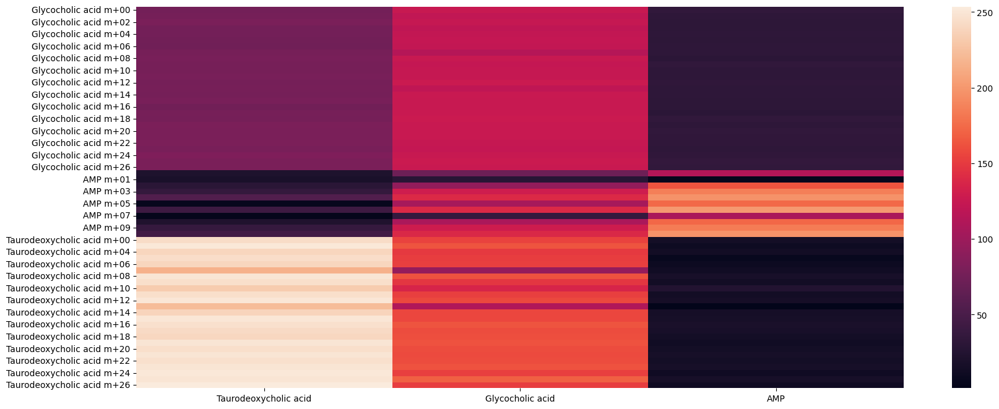

In [43]:
specifics = np.concatenate((gcm_output[0][0], gcm_output[1][0], gcm_output[2][0]))
specifics_df = pd.DataFrame(specifics, index = metabolites, columns = short_isos.columns).transpose()
metabs_from_isos = [i[:-5] for i in list(specifics_df.index)]

print(specifics.shape)
display(specifics_df)
fig, ax = plt.subplots(figsize=(20, 8))
sns.heatmap(specifics_df, ax=ax)


In [119]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from itertools import groupby
import datetime
import seaborn as sns

def add_line(ax, xpos, ypos, linewidth=0.5):
    line = plt.Line2D([ypos, ypos+ .2], [xpos, xpos], color='black', transform=ax.transAxes, linewidth=linewidth)
    line.set_clip_on(False)
    ax.add_line(line)

def label_len(my_index,level):
    labels = my_index.get_level_values(level)
    return [(k, sum(1 for i in g)) for k,g in groupby(labels)]

def label_group_bar_table(ax, df):
    linepos = -0.2
    xpos = -0.05
    scale = 1./df.index.size
    for level in range(df.index.nlevels):
        pos = df.index.size
        for label, rpos in label_len(df.index,level):
            if rpos > 1:
                add_line(ax, pos*scale, linepos)
                pos -= rpos
                lypos = (pos + .5 * rpos)*scale
                ax.text(xpos+.1, lypos, label, rotation = 90, va = 'center', ha='center', transform=ax.transAxes)
        add_line(ax, pos*scale , linepos)
        xpos -= .2


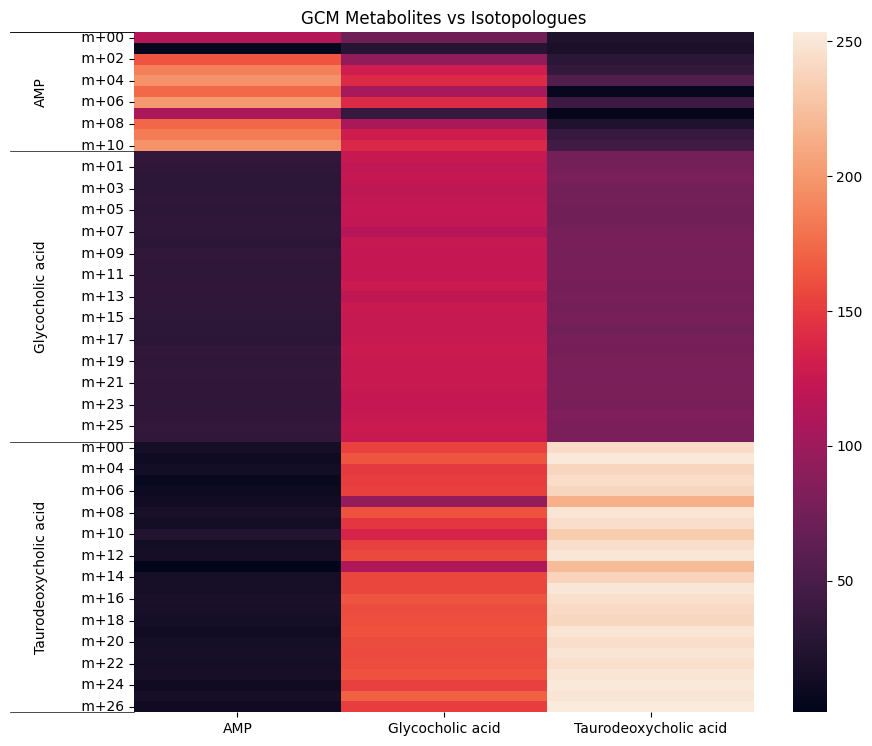

In [121]:
specifics = np.concatenate((gcm_output[0][0], gcm_output[1][0], gcm_output[2][0])).T
iso_names = short_isos.columns
metabs_from_isos = [iso[:-5] for iso in iso_names]

tuples = list(zip(iso_names, metabs_from_isos))
index = pd.MultiIndex.from_tuples(tuples, names=['isotopologue', 'metabolite'])

df = pd.DataFrame(specifics, index=index, columns=metabolites)
df = df.reindex(sorted(df.columns), axis=1).sort_index(level='isotopologue')

fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(111)
sns.heatmap(df)

#Below 3 lines remove default labels
labels = [item.get_text().split('-')[0][-5:] for item in ax.get_yticklabels()]
ax.set_yticklabels(labels)
ax.set_ylabel('')

label_group_bar_table(ax, df)
fig.subplots_adjust(bottom=.1*df.index.nlevels)
plt.title("GCM Metabolites vs Isotopologues")
plt.show()


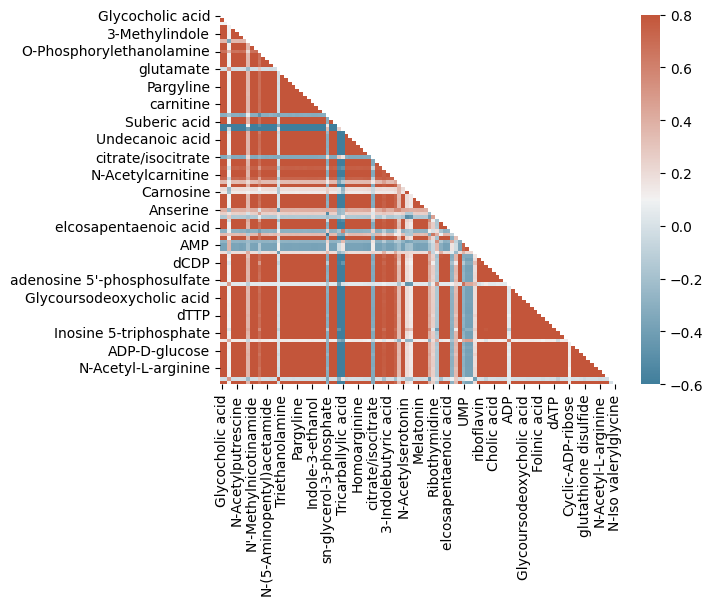

In [123]:
vis.corr_heatmap(Brain_3HB_IsoLearner.clean_ion_data[1])

ValueError: The number of FixedLocator locations (35), usually from a call to set_ticks, does not match the number of labels (1290).

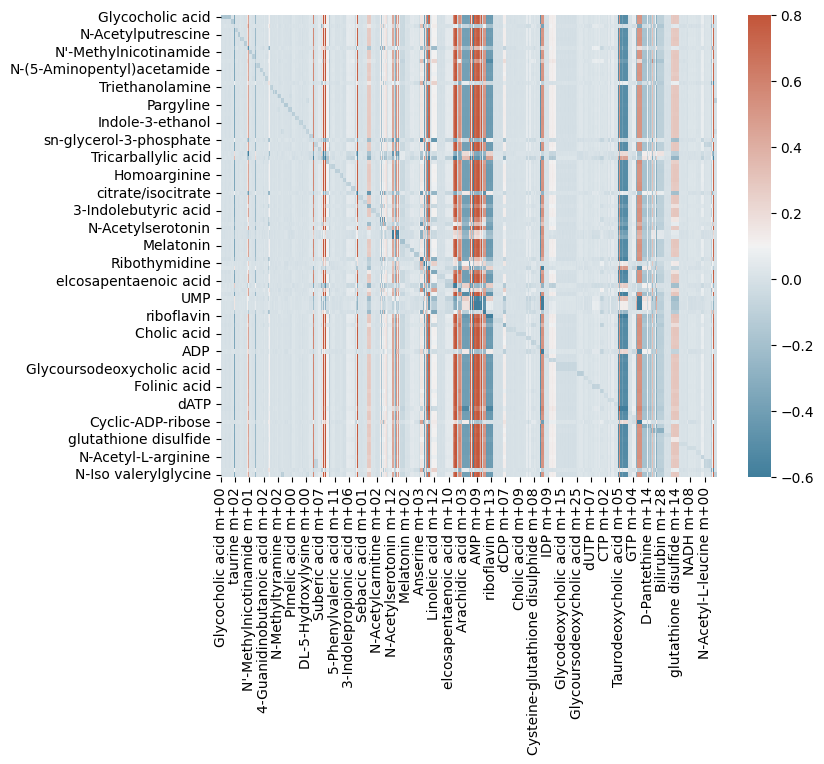

In [134]:
vis.compare_corr_heatmap(Brain_3HB_IsoLearner.clean_ion_data[1], Brain_3HB_IsoLearner.clean_iso_data[1])

In [144]:
# Example Implementation: 
# ===========================================================
print("Starting GCM Calculations") 
num_cols = len(metabolites)
mutation_index = 0
gcm_output_3 = [None] * num_cols # np.fromiter(np.zeros(num_cols), dtype=float)

all_mutations = short_metabs.astype(float)  # The features (metabolites) that are being considered
Y_data = short_isos.astype(float) # The targets (isotopologues)

# all_mutations = expanded_df.iloc[:, 9:].astype(float) # -> All Mutations We are Testing Over
# Y_data = expanded_df.iloc[:,0:8].astype(float)

y_data = Y_data.values # -> Outputs don't change over the various features we are testing. 
print(f'Y data shape: {y_data.shape}')

while mutation_index < num_cols: # -> Per Mutation (feature)
    print(mutation_index)
    X_data = (all_mutations.iloc[:,mutation_index]).values.reshape(-1,1)
    print(X_data.shape)
    
    #Calculate marginal p_values and if any of the columns of Y 
    # If there's zero correlation, we know there will be no dependence --> ask wes about this
    #r, p_value = pearsonr(X_data, y_data) # -> Skip any features or mutations that don't matter
    #if p_value < 0.05: 
    Z_data = all_mutations.drop(all_mutations.columns[mutation_index], axis=1)
    print(Z_data.shape)

    if False:
        # Get just the top 100 PCs as a quick sub for Z -> wanted to reduce calculations, PCA helps prevent overfitting
        pca = PCA(n_components=5) # -> PCA Decomposition to help reduce dimensionality and reduce overfitting by the models. 
        pca.fit(Z_data.T)
        pca_Z_data = pca.components_.T
    
    test_mutation_results = multi_gcm_test(X_data, y_data, Z_data, IsoLearner.NeuralNetRegressorX, IsoLearner.NeuralNetRegressorY) # -> Calling the actual test mutation method
    gcm_output_3[mutation_index] = test_mutation_results #p_value -> Saving Pvalue Results
    #else: 
    #    gcm_output[mutation_index] = 1

    if mutation_index % 50 == 0:
        print(mutation_index)
        #if gcm_output[mutation_index] < 1:
        #    print(gcm_output[mutation_index])
    mutation_index += 1

print("Finished")

Starting GCM Calculations
Y data shape: (123595, 63)
0
(123595, 1)
(123595, 2)
Epoch 1/50
3863/3863 - 9s - loss: 3.2951 - mse: 0.5809 - mae: 0.5606 - 9s/epoch - 2ms/step
Epoch 2/50
3863/3863 - 7s - loss: 1.8772 - mse: 0.0941 - mae: 0.2455 - 7s/epoch - 2ms/step
Epoch 3/50
3863/3863 - 7s - loss: 0.7252 - mse: 0.0697 - mae: 0.2148 - 7s/epoch - 2ms/step
Epoch 4/50
3863/3863 - 7s - loss: 0.3385 - mse: 0.0646 - mae: 0.2069 - 7s/epoch - 2ms/step
Epoch 5/50
3863/3863 - 7s - loss: 0.2382 - mse: 0.0629 - mae: 0.2042 - 7s/epoch - 2ms/step
Epoch 6/50
3863/3863 - 7s - loss: 0.1875 - mse: 0.0623 - mae: 0.2031 - 7s/epoch - 2ms/step
Epoch 7/50
3863/3863 - 7s - loss: 0.1537 - mse: 0.0620 - mae: 0.2025 - 7s/epoch - 2ms/step
Epoch 8/50
3863/3863 - 7s - loss: 0.1294 - mse: 0.0618 - mae: 0.2022 - 7s/epoch - 2ms/step
Epoch 9/50
3863/3863 - 7s - loss: 0.1113 - mse: 0.0618 - mae: 0.2021 - 7s/epoch - 2ms/step
Epoch 10/50
3863/3863 - 7s - loss: 0.0981 - mse: 0.0617 - mae: 0.2020 - 7s/epoch - 2ms/step
Epoch 11/5

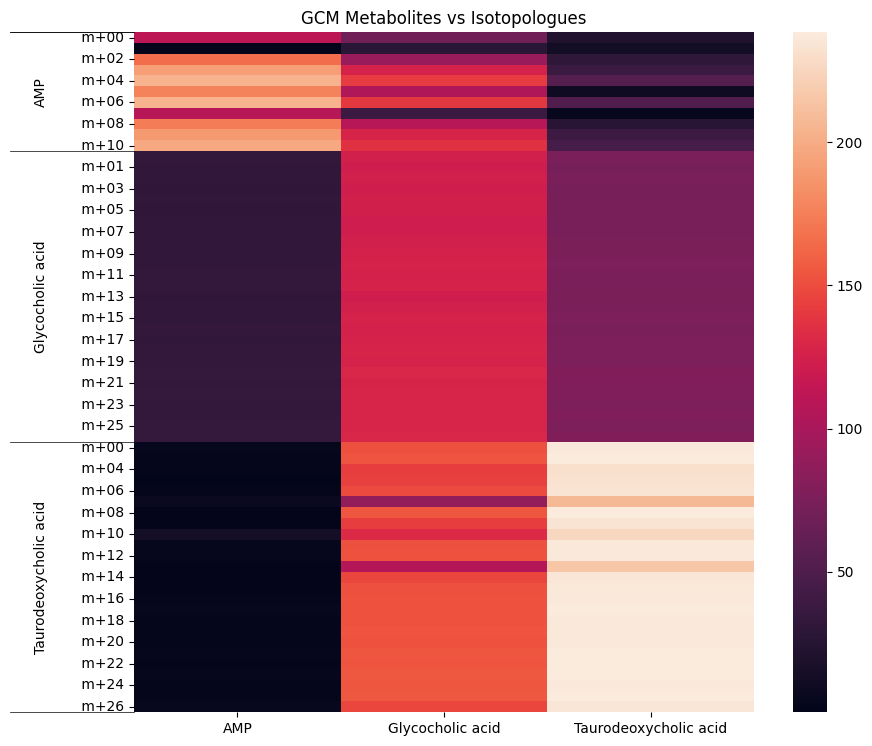

In [147]:
specifics = np.concatenate((gcm_output_3[0][0], gcm_output_3[1][0], gcm_output_3[2][0])).T
iso_names = short_isos.columns
metabs_from_isos = [iso[:-5] for iso in iso_names]

tuples = list(zip(iso_names, metabs_from_isos))
index = pd.MultiIndex.from_tuples(tuples, names=['isotopologue', 'metabolite'])

df = pd.DataFrame(specifics, index=index, columns=metabolites)
df = df.reindex(sorted(df.columns), axis=1).sort_index(level='isotopologue')

fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(111)
sns.heatmap(df)

#Below 3 lines remove default labels
labels = [item.get_text().split('-')[0][-5:] for item in ax.get_yticklabels()]
ax.set_yticklabels(labels)
ax.set_ylabel('')

label_group_bar_table(ax, df)
fig.subplots_adjust(bottom=.1*df.index.nlevels)
plt.title("GCM Metabolites vs Isotopologues")
plt.show()


# Glucose

## Original Model

In [78]:
Brain_Glucose_IsoLearner = IsoLearner.IsoLearner(
                                            absolute_data_path = "/Users/bisramr/MATLAB/Projects/Isoscope_Matlab_V/generated-data",
                                            relative_data_path = "brain-m0-no-log/Brain-Glucose",
                                            morans_path = 'Morans-values/brain-glucose-morans-iso.txt', 
                                            tracer = 'BG',
                                            morans_strat = 2,
                                            morans_cutoff = 0.6,
                                            min_replicates = 3
)

Initializing IsoLearner
Cleaning data with strategy 2: ========================> The dataset has been checked for inconsistencies
Inconsistencies found: 10 metabolites, 313 isotopolouges
File 0: /Users/bisramr/MATLAB/Projects/Isoscope_Matlab_V/generated-data/brain-m0-no-log/Brain-Glucose/BG-ND-M1-FML-ioncounts-ranks.csv || 5 to drop || 5 dropped
File 1: /Users/bisramr/MATLAB/Projects/Isoscope_Matlab_V/generated-data/brain-m0-no-log/Brain-Glucose/BG-ND-M2-FML-ioncounts-ranks.csv || 10 to drop || 10 dropped
File 2: /Users/bisramr/MATLAB/Projects/Isoscope_Matlab_V/generated-data/brain-m0-no-log/Brain-Glucose/BG-ND-M3-FML-ioncounts-ranks.csv || 5 to drop || 5 dropped
File 3: /Users/bisramr/MATLAB/Projects/Isoscope_Matlab_V/generated-data/brain-m0-no-log/Brain-Glucose/BG-KD-M1-FML-ioncounts-ranks.csv || 0 to drop || 0 dropped
File 4: /Users/bisramr/MATLAB/Projects/Isoscope_Matlab_V/generated-data/brain-m0-no-log/Brain-Glucose/BG-KD-M2-FML-ioncounts-ranks.csv || 0 to drop || 0 dropped
File 5

WE ARE IN THIS FUNCTION
Creating checkpoint directory
Training with replicate 0 heldout. # samples = 83851
HI
Epoch 1/100
525/525 [==============================] - 4s 6ms/step - loss: 37.8235 - mse: 1.9757 - mae: 1.1037 - val_loss: 33.1665 - val_mse: 1.0970 - val_mae: 0.8184
Epoch 2/100
525/525 [==============================] - 2s 5ms/step - loss: 29.8422 - mse: 1.0843 - mae: 0.8087 - val_loss: 26.1631 - val_mse: 0.5813 - val_mae: 0.6067
Epoch 3/100
525/525 [==============================] - 2s 5ms/step - loss: 23.2303 - mse: 0.5244 - mae: 0.5795 - val_loss: 20.2922 - val_mse: 0.3435 - val_mae: 0.4865
Epoch 4/100
525/525 [==============================] - 3s 5ms/step - loss: 17.8708 - mse: 0.3652 - mae: 0.4949 - val_loss: 15.4761 - val_mse: 0.2812 - val_mae: 0.4449
Epoch 5/100
525/525 [==============================] - 2s 5ms/step - loss: 13.4936 - mse: 0.3006 - mae: 0.4525 - val_loss: 11.5656 - val_mse: 0.2479 - val_mae: 0.4177
Epoch 6/100
525/525 [==============================] - 

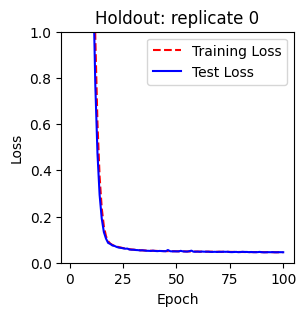

Training with replicate 1 heldout. # samples = 76089
HI
Epoch 1/100
476/476 [==============================] - 3s 5ms/step - loss: 38.1526 - mse: 2.0044 - mae: 1.1109 - val_loss: 33.8124 - val_mse: 1.1050 - val_mae: 0.8137
Epoch 2/100
476/476 [==============================] - 2s 5ms/step - loss: 30.8577 - mse: 1.2080 - mae: 0.8485 - val_loss: 27.4088 - val_mse: 0.6934 - val_mae: 0.6483
Epoch 3/100
476/476 [==============================] - 2s 5ms/step - loss: 24.6609 - mse: 0.6306 - mae: 0.6257 - val_loss: 21.8551 - val_mse: 0.4116 - val_mae: 0.5192
Epoch 4/100
476/476 [==============================] - 2s 5ms/step - loss: 19.5317 - mse: 0.4215 - mae: 0.5242 - val_loss: 17.1954 - val_mse: 0.3103 - val_mae: 0.4629
Epoch 5/100
476/476 [==============================] - 2s 5ms/step - loss: 15.2492 - mse: 0.3347 - mae: 0.4736 - val_loss: 13.3193 - val_mse: 0.2684 - val_mae: 0.4328
Epoch 6/100
476/476 [==============================] - 2s 5ms/step - loss: 11.7102 - mse: 0.2849 - mae: 0.439

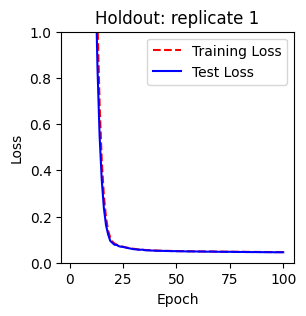

Training with replicate 2 heldout. # samples = 84561
HI
Epoch 1/100
529/529 [==============================] - 3s 5ms/step - loss: 37.8418 - mse: 2.0035 - mae: 1.1136 - val_loss: 33.1445 - val_mse: 1.0891 - val_mae: 0.8225
Epoch 2/100
529/529 [==============================] - 2s 5ms/step - loss: 29.8620 - mse: 1.1197 - mae: 0.8210 - val_loss: 26.1612 - val_mse: 0.5801 - val_mae: 0.6033
Epoch 3/100
529/529 [==============================] - 2s 4ms/step - loss: 23.2328 - mse: 0.5240 - mae: 0.5786 - val_loss: 20.2903 - val_mse: 0.3342 - val_mae: 0.4808
Epoch 4/100
529/529 [==============================] - 2s 5ms/step - loss: 17.8709 - mse: 0.3639 - mae: 0.4941 - val_loss: 15.4680 - val_mse: 0.2753 - val_mae: 0.4414
Epoch 5/100
529/529 [==============================] - 2s 5ms/step - loss: 13.4799 - mse: 0.2977 - mae: 0.4508 - val_loss: 11.5450 - val_mse: 0.2437 - val_mae: 0.4154
Epoch 6/100
529/529 [==============================] - 2s 5ms/step - loss: 9.9495 - mse: 0.2535 - mae: 0.4170

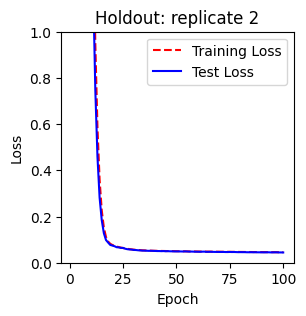

Training with replicate 3 heldout. # samples = 81237
HI
Epoch 1/100
508/508 [==============================] - 3s 5ms/step - loss: 37.9717 - mse: 1.9991 - mae: 1.1098 - val_loss: 33.2660 - val_mse: 0.9492 - val_mae: 0.7772
Epoch 2/100
508/508 [==============================] - 2s 5ms/step - loss: 30.3084 - mse: 1.2144 - mae: 0.8530 - val_loss: 26.7512 - val_mse: 0.7304 - val_mae: 0.6665
Epoch 3/100
508/508 [==============================] - 3s 5ms/step - loss: 23.8282 - mse: 0.6003 - mae: 0.6154 - val_loss: 20.9375 - val_mse: 0.3895 - val_mae: 0.5123
Epoch 4/100
508/508 [==============================] - 2s 5ms/step - loss: 18.5317 - mse: 0.3874 - mae: 0.5082 - val_loss: 16.1596 - val_mse: 0.2957 - val_mae: 0.4559
Epoch 5/100
508/508 [==============================] - 2s 5ms/step - loss: 14.1739 - mse: 0.3106 - mae: 0.4600 - val_loss: 12.2406 - val_mse: 0.2565 - val_mae: 0.4254
Epoch 6/100
508/508 [==============================] - 2s 5ms/step - loss: 10.6302 - mse: 0.2657 - mae: 0.426

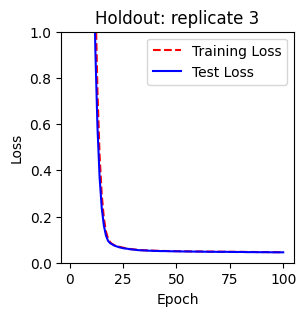

Training with replicate 4 heldout. # samples = 78306
HI
Epoch 1/100
490/490 [==============================] - 3s 5ms/step - loss: 38.0229 - mse: 1.9982 - mae: 1.1062 - val_loss: 33.4617 - val_mse: 0.9860 - val_mae: 0.7832
Epoch 2/100
490/490 [==============================] - 2s 5ms/step - loss: 30.5252 - mse: 1.1840 - mae: 0.8352 - val_loss: 26.9960 - val_mse: 0.6557 - val_mae: 0.6292
Epoch 3/100
490/490 [==============================] - 2s 5ms/step - loss: 24.1695 - mse: 0.5691 - mae: 0.5958 - val_loss: 21.3246 - val_mse: 0.3653 - val_mae: 0.4974
Epoch 4/100
490/490 [==============================] - 2s 4ms/step - loss: 18.9731 - mse: 0.3888 - mae: 0.5073 - val_loss: 16.6211 - val_mse: 0.2960 - val_mae: 0.4555
Epoch 5/100
490/490 [==============================] - 2s 5ms/step - loss: 14.6585 - mse: 0.3190 - mae: 0.4646 - val_loss: 12.7293 - val_mse: 0.2614 - val_mae: 0.4288
Epoch 6/100
490/490 [==============================] - 2s 5ms/step - loss: 11.1235 - mse: 0.2746 - mae: 0.432

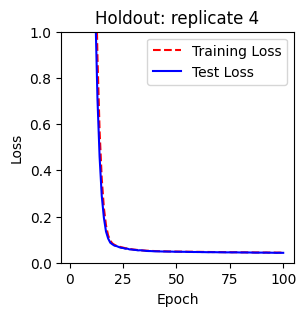

Training with replicate 5 heldout. # samples = 78306
HI
Epoch 1/100
490/490 [==============================] - 3s 6ms/step - loss: 38.0891 - mse: 2.0176 - mae: 1.1123 - val_loss: 33.4593 - val_mse: 0.9484 - val_mae: 0.7745
Epoch 2/100
490/490 [==============================] - 2s 5ms/step - loss: 30.6083 - mse: 1.2378 - mae: 0.8556 - val_loss: 27.0930 - val_mse: 0.7218 - val_mae: 0.6540
Epoch 3/100
490/490 [==============================] - 2s 5ms/step - loss: 24.2409 - mse: 0.5992 - mae: 0.6090 - val_loss: 21.3937 - val_mse: 0.3826 - val_mae: 0.5048
Epoch 4/100
490/490 [==============================] - 2s 5ms/step - loss: 19.0390 - mse: 0.3969 - mae: 0.5114 - val_loss: 16.6876 - val_mse: 0.3011 - val_mae: 0.4580
Epoch 5/100
490/490 [==============================] - 3s 5ms/step - loss: 14.7218 - mse: 0.3208 - mae: 0.4655 - val_loss: 12.7914 - val_mse: 0.2630 - val_mae: 0.4298
Epoch 6/100
490/490 [==============================] - 2s 5ms/step - loss: 11.1812 - mse: 0.2744 - mae: 0.432

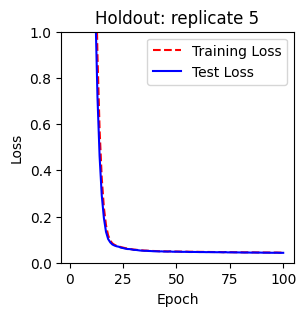

0

In [79]:
Brain_Glucose_IsoLearner.cross_validation_training(checkpoints_dir_label = "Glucose-Morans3")

In [80]:
ground_truth_Glucose_Morans3, predictions_Glucose_Morans3 = Brain_Glucose_IsoLearner.cross_validation_testing(checkpoints_dir_label = "Glucose-Morans3")

Testing with replicate 0 heldout. # samples = 17160
537/537 [==============================] - 0s 728us/step
Testing with replicate 1 heldout. # samples = 24922
779/779 [==============================] - 1s 708us/step
Testing with replicate 2 heldout. # samples = 16450
515/515 [==============================] - 0s 703us/step
Testing with replicate 3 heldout. # samples = 19774
618/618 [==============================] - 1s 728us/step
Testing with replicate 4 heldout. # samples = 22705
710/710 [==============================] - 1s 793us/step
Testing with replicate 5 heldout. # samples = 21546
674/674 [==============================] - 1s 769us/step


### Results

(122557, 585) (122557, 585)


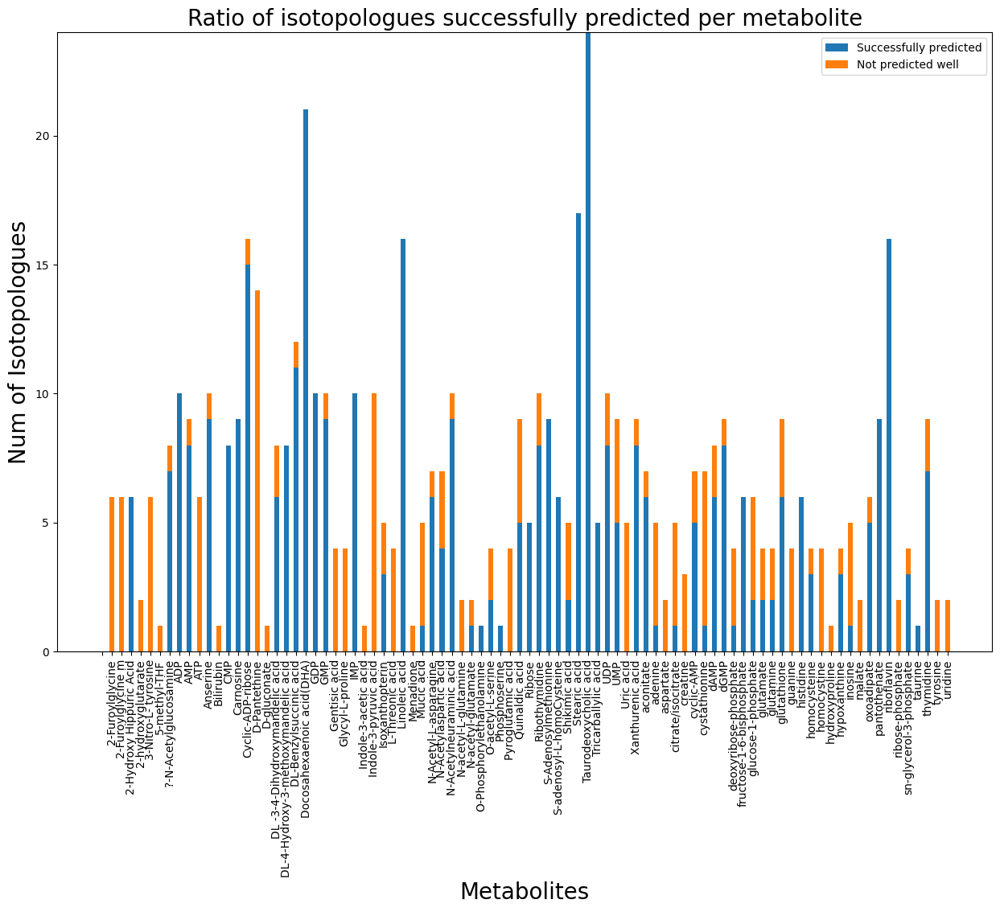

In [100]:
Brain_Glucose_IsoLearner.cross_validation_eval_metrics(ground_truth_Glucose_Morans3, predictions_Glucose_Morans3)

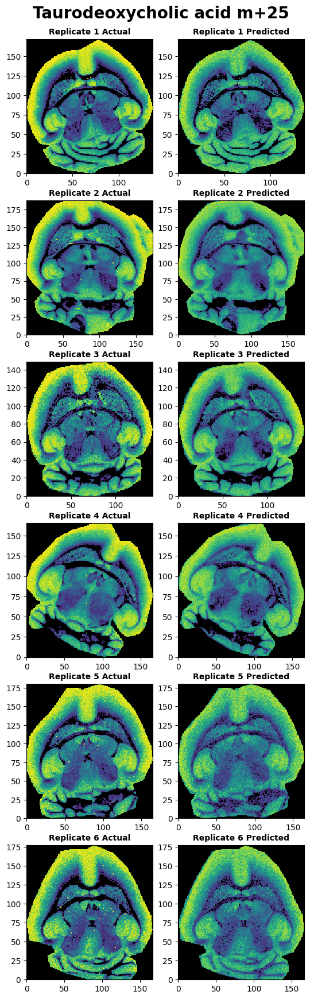

In [85]:
vis.cross_validation_results(ground_truth_Glucose_Morans3, predictions_Glucose_Morans3, coords_df=Brain_Glucose_IsoLearner.coords_df, iso_to_plot="Taurodeoxycholic acid m+25")

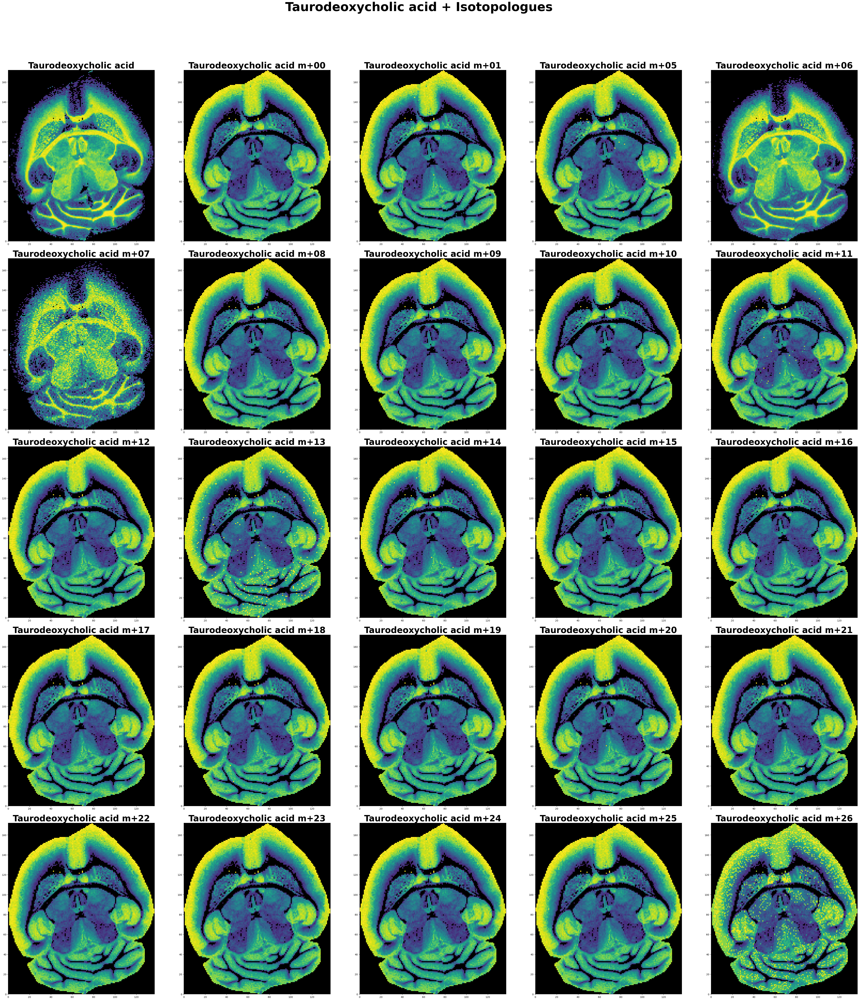

In [86]:
for i in range(1):
    _ = vis.plot_metab_and_isos(Brain_Glucose_IsoLearner.clean_ion_data[i], Brain_Glucose_IsoLearner.clean_iso_data[i], Brain_Glucose_IsoLearner.coords_df[i], metab_to_plot="Taurodeoxycholic acid")

## Best possible model

In [11]:
Brain_Glucose_IsoLearner_2 = IsoLearner.IsoLearner(
                                            absolute_data_path = "/Users/bisramr/MATLAB/Projects/Isoscope_Matlab_V/generated-data",
                                            relative_data_path = "brain-m0-no-log/Brain-Glucose",
                                            morans_path = 'Morans-values/brain-glucose-morans-iso.txt', 
                                            tracer = 'BG',
                                            morans_strat = 2,
                                            morans_cutoff = 0.6,
                                            min_replicates = 3, 
                                            shared_morans_file=False
)

Initializing IsoLearner
Cleaning data with strategy 2: In Glucose Tracing Loop
========================> The dataset has been checked for inconsistencies
Inconsistencies found: 10 metabolites, 313 isotopolouges
File 0: /Users/bisramr/MATLAB/Projects/Isoscope_Matlab_V/generated-data/brain-m0-no-log/Brain-Glucose/BG-ND-M1-FML-ioncounts-ranks.csv || 5 to drop || 5 dropped
File 1: /Users/bisramr/MATLAB/Projects/Isoscope_Matlab_V/generated-data/brain-m0-no-log/Brain-Glucose/BG-ND-M2-FML-ioncounts-ranks.csv || 10 to drop || 10 dropped
File 2: /Users/bisramr/MATLAB/Projects/Isoscope_Matlab_V/generated-data/brain-m0-no-log/Brain-Glucose/BG-ND-M3-FML-ioncounts-ranks.csv || 5 to drop || 5 dropped
File 3: /Users/bisramr/MATLAB/Projects/Isoscope_Matlab_V/generated-data/brain-m0-no-log/Brain-Glucose/BG-KD-M1-FML-ioncounts-ranks.csv || 0 to drop || 0 dropped
File 4: /Users/bisramr/MATLAB/Projects/Isoscope_Matlab_V/generated-data/brain-m0-no-log/Brain-Glucose/BG-KD-M2-FML-ioncounts-ranks.csv || 0 to 

WE ARE IN THIS FUNCTION
Creating checkpoint directory
Training with replicate 0 heldout. # samples = 83851
HI
Epoch 1/100
525/525 [==============================] - 7s 12ms/step - loss: 68.0454 - mse: 1.6673 - mae: 1.0092 - val_loss: 56.0842 - val_mse: 0.5843 - val_mae: 0.6137
Epoch 2/100
525/525 [==============================] - 6s 11ms/step - loss: 46.8633 - mse: 0.5371 - mae: 0.5869 - val_loss: 38.1291 - val_mse: 0.3084 - val_mae: 0.4707
Epoch 3/100
525/525 [==============================] - 6s 12ms/step - loss: 31.2026 - mse: 0.3253 - mae: 0.4728 - val_loss: 24.8602 - val_mse: 0.2506 - val_mae: 0.4242
Epoch 4/100
525/525 [==============================] - 6s 11ms/step - loss: 19.9472 - mse: 0.2511 - mae: 0.4160 - val_loss: 15.5392 - val_mse: 0.2065 - val_mae: 0.3793
Epoch 5/100
525/525 [==============================] - 6s 11ms/step - loss: 12.2087 - mse: 0.1936 - mae: 0.3622 - val_loss: 9.2766 - val_mse: 0.1639 - val_mae: 0.3331
Epoch 6/100
525/525 [==============================

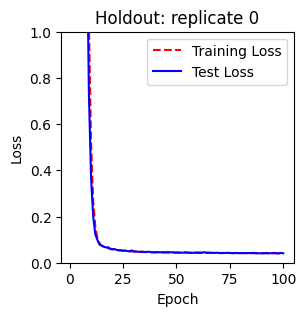

Training with replicate 1 heldout. # samples = 76089
HI
Epoch 1/100
476/476 [==============================] - 6s 12ms/step - loss: 69.2030 - mse: 1.7352 - mae: 1.0302 - val_loss: 58.0912 - val_mse: 0.6125 - val_mae: 0.6258
Epoch 2/100
476/476 [==============================] - 5s 11ms/step - loss: 49.5161 - mse: 0.6168 - mae: 0.6220 - val_loss: 41.1929 - val_mse: 0.3299 - val_mae: 0.4840
Epoch 3/100
476/476 [==============================] - 5s 11ms/step - loss: 34.4636 - mse: 0.3500 - mae: 0.4883 - val_loss: 28.2039 - val_mse: 0.2641 - val_mae: 0.4368
Epoch 4/100
476/476 [==============================] - 6s 12ms/step - loss: 23.2147 - mse: 0.2710 - mae: 0.4325 - val_loss: 18.6603 - val_mse: 0.2208 - val_mae: 0.3946
Epoch 5/100
476/476 [==============================] - 5s 11ms/step - loss: 15.1021 - mse: 0.2141 - mae: 0.3823 - val_loss: 11.9037 - val_mse: 0.1785 - val_mae: 0.3498
Epoch 6/100
476/476 [==============================] - 5s 11ms/step - loss: 9.4589 - mse: 0.1666 - mae: 

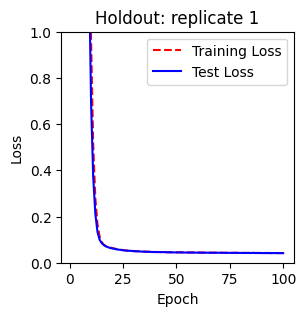

Training with replicate 2 heldout. # samples = 84561
HI
Epoch 1/100
529/529 [==============================] - 6s 11ms/step - loss: 68.0357 - mse: 1.6809 - mae: 1.0165 - val_loss: 56.0124 - val_mse: 0.5983 - val_mae: 0.6206
Epoch 2/100
529/529 [==============================] - 6s 11ms/step - loss: 46.7153 - mse: 0.5554 - mae: 0.5965 - val_loss: 37.9185 - val_mse: 0.3064 - val_mae: 0.4692
Epoch 3/100
529/529 [==============================] - 6s 11ms/step - loss: 30.9638 - mse: 0.3231 - mae: 0.4712 - val_loss: 24.6156 - val_mse: 0.2494 - val_mae: 0.4233
Epoch 4/100
529/529 [==============================] - 6s 11ms/step - loss: 19.7020 - mse: 0.2480 - mae: 0.4132 - val_loss: 15.3102 - val_mse: 0.2048 - val_mae: 0.3772
Epoch 5/100
529/529 [==============================] - 6s 11ms/step - loss: 11.9945 - mse: 0.1906 - mae: 0.3587 - val_loss: 9.0882 - val_mse: 0.1632 - val_mae: 0.3319
Epoch 6/100
529/529 [==============================] - 6s 11ms/step - loss: 6.9538 - mse: 0.1460 - mae: 0

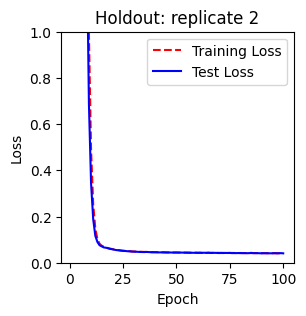

Training with replicate 3 heldout. # samples = 81237
HI
Epoch 1/100
508/508 [==============================] - 6s 11ms/step - loss: 68.5077 - mse: 1.6907 - mae: 1.0171 - val_loss: 56.8687 - val_mse: 0.5982 - val_mae: 0.6205
Epoch 2/100
508/508 [==============================] - 6s 12ms/step - loss: 47.8083 - mse: 0.5548 - mae: 0.5958 - val_loss: 39.1960 - val_mse: 0.3164 - val_mae: 0.4755
Epoch 3/100
508/508 [==============================] - 6s 12ms/step - loss: 32.3049 - mse: 0.3342 - mae: 0.4783 - val_loss: 25.9725 - val_mse: 0.2533 - val_mae: 0.4270
Epoch 4/100
508/508 [==============================] - 6s 12ms/step - loss: 21.0159 - mse: 0.2572 - mae: 0.4212 - val_loss: 16.5477 - val_mse: 0.2080 - val_mae: 0.3818
Epoch 5/100
508/508 [==============================] - 6s 12ms/step - loss: 13.1313 - mse: 0.1991 - mae: 0.3680 - val_loss: 10.1053 - val_mse: 0.1669 - val_mae: 0.3367
Epoch 6/100
508/508 [==============================] - 6s 11ms/step - loss: 7.8486 - mse: 0.1533 - mae: 

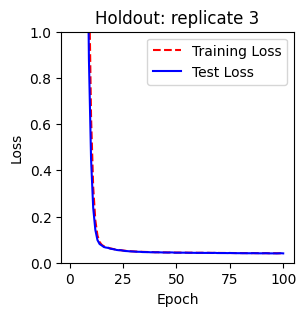

Training with replicate 4 heldout. # samples = 78306
HI
Epoch 1/100
490/490 [==============================] - 6s 11ms/step - loss: 68.7928 - mse: 1.6526 - mae: 1.0015 - val_loss: 57.4166 - val_mse: 0.5472 - val_mae: 0.5964
Epoch 2/100
490/490 [==============================] - 5s 11ms/step - loss: 48.5813 - mse: 0.5612 - mae: 0.5985 - val_loss: 40.0940 - val_mse: 0.3176 - val_mae: 0.4762
Epoch 3/100
490/490 [==============================] - 5s 11ms/step - loss: 33.2865 - mse: 0.3424 - mae: 0.4835 - val_loss: 26.9868 - val_mse: 0.2573 - val_mae: 0.4301
Epoch 4/100
490/490 [==============================] - 5s 11ms/step - loss: 22.0265 - mse: 0.2651 - mae: 0.4275 - val_loss: 17.5210 - val_mse: 0.2141 - val_mae: 0.3875
Epoch 5/100
490/490 [==============================] - 6s 11ms/step - loss: 14.0460 - mse: 0.2075 - mae: 0.3760 - val_loss: 10.9401 - val_mse: 0.1721 - val_mae: 0.3423
Epoch 6/100
490/490 [==============================] - 6s 11ms/step - loss: 8.5992 - mse: 0.1605 - mae: 

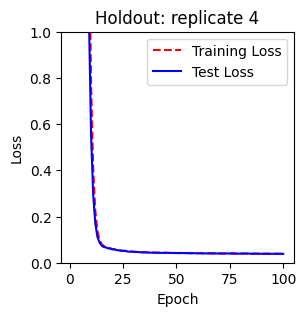

Training with replicate 5 heldout. # samples = 78306
HI
Epoch 1/100
490/490 [==============================] - 6s 11ms/step - loss: 68.8766 - mse: 1.7448 - mae: 1.0355 - val_loss: 57.5269 - val_mse: 0.6347 - val_mae: 0.6386
Epoch 2/100
490/490 [==============================] - 5s 11ms/step - loss: 48.8060 - mse: 0.6324 - mae: 0.6308 - val_loss: 40.3626 - val_mse: 0.3303 - val_mae: 0.4835
Epoch 3/100
490/490 [==============================] - 5s 11ms/step - loss: 33.5817 - mse: 0.3455 - mae: 0.4855 - val_loss: 27.2965 - val_mse: 0.2610 - val_mae: 0.4346
Epoch 4/100
490/490 [==============================] - 5s 11ms/step - loss: 22.3167 - mse: 0.2632 - mae: 0.4267 - val_loss: 17.7961 - val_mse: 0.2183 - val_mae: 0.3926
Epoch 5/100
490/490 [==============================] - 5s 11ms/step - loss: 14.2872 - mse: 0.2064 - mae: 0.3751 - val_loss: 11.1570 - val_mse: 0.1768 - val_mae: 0.3476
Epoch 6/100
490/490 [==============================] - 5s 11ms/step - loss: 8.7814 - mse: 0.1601 - mae: 

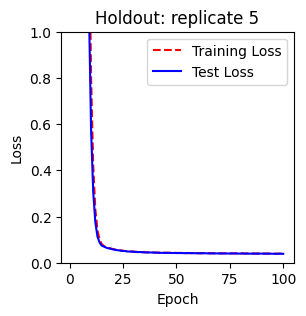

0

In [88]:
Brain_Glucose_IsoLearner_2.cross_validation_training(checkpoints_dir_label = "Glucose-Morans-optimal-model")

In [28]:
ground_truth_Glucose_optimal, predictions_Glucose_optimal = Brain_Glucose_IsoLearner_2.cross_validation_testing(checkpoints_dir_label = "Glucose-Morans-optimal-model")

Testing with replicate 0 heldout. # samples = 17160
537/537 [==============================] - 1s 1ms/step
Testing with replicate 1 heldout. # samples = 24922
779/779 [==============================] - 1s 1ms/step
Testing with replicate 2 heldout. # samples = 16450
515/515 [==============================] - 1s 1ms/step
Testing with replicate 3 heldout. # samples = 19774
618/618 [==============================] - 1s 1ms/step
Testing with replicate 4 heldout. # samples = 22705
710/710 [==============================] - 1s 1ms/step
Testing with replicate 5 heldout. # samples = 21546
674/674 [==============================] - 1s 1ms/step


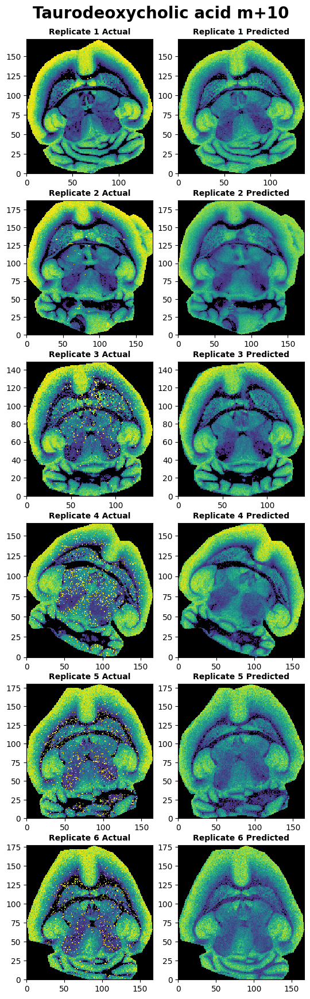

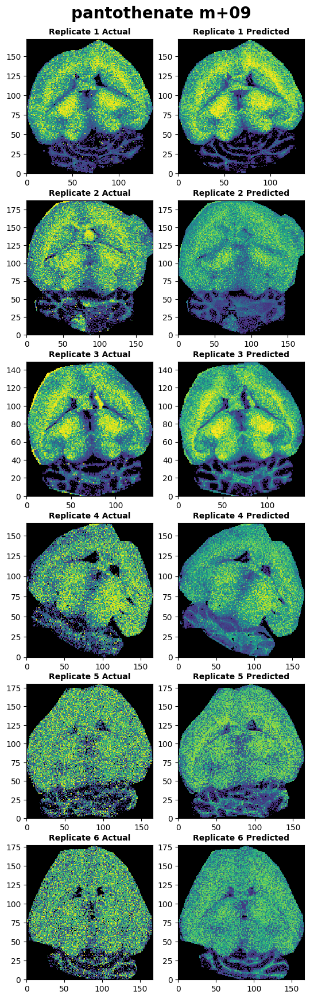

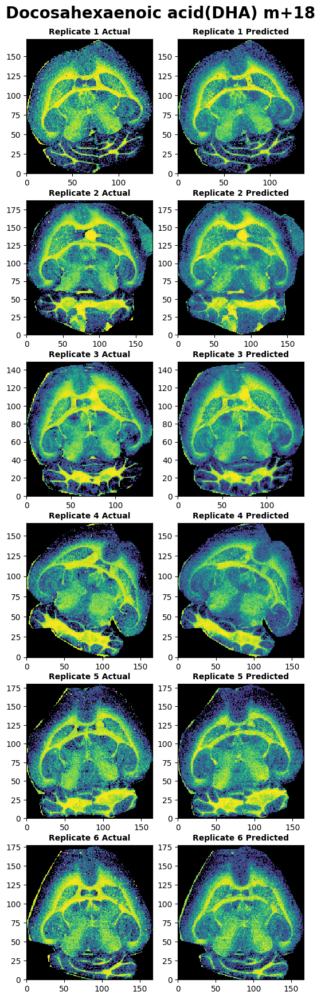

In [167]:
for isotopologue in ['Taurodeoxycholic acid m+10', 'pantothenate m+09', 'Docosahexaenoic acid(DHA) m+18']:
    vis.cross_validation_results(ground_truth_Glucose_optimal, predictions_Glucose_optimal, Brain_Glucose_IsoLearner_2.coords_df, iso_to_plot=isotopologue)

(122557, 583) (122557, 583)


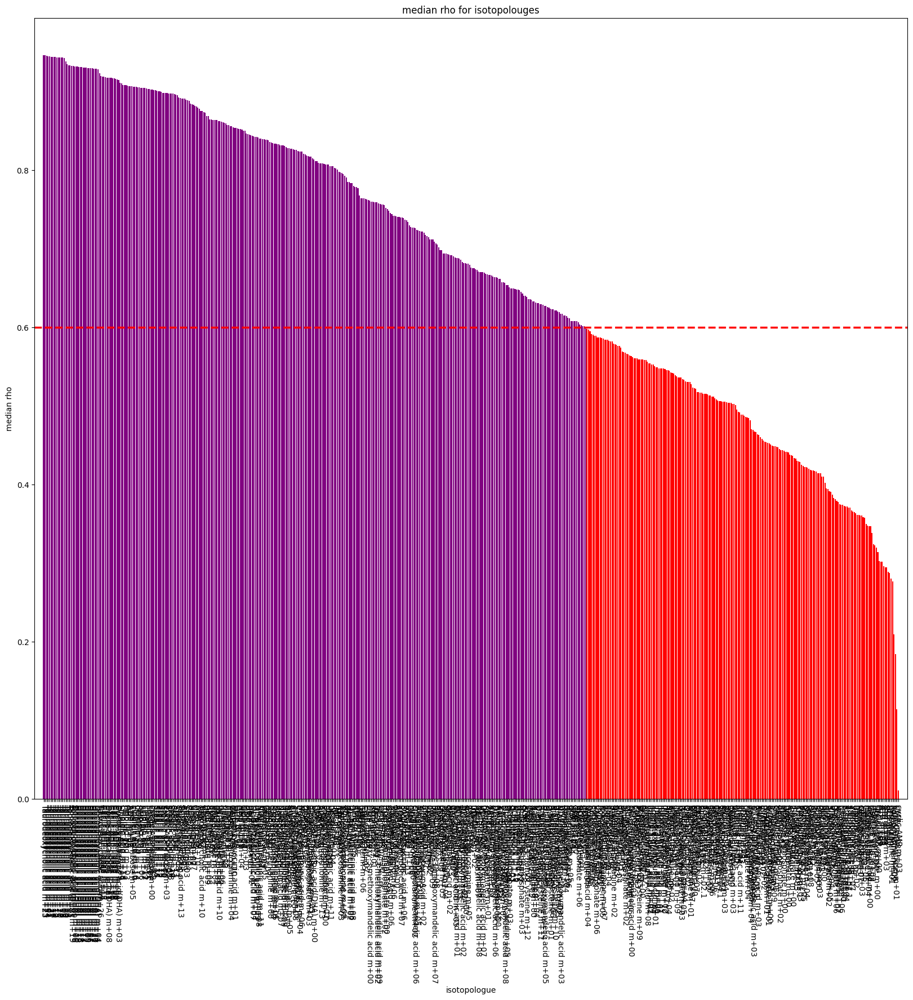

Done with spearmans


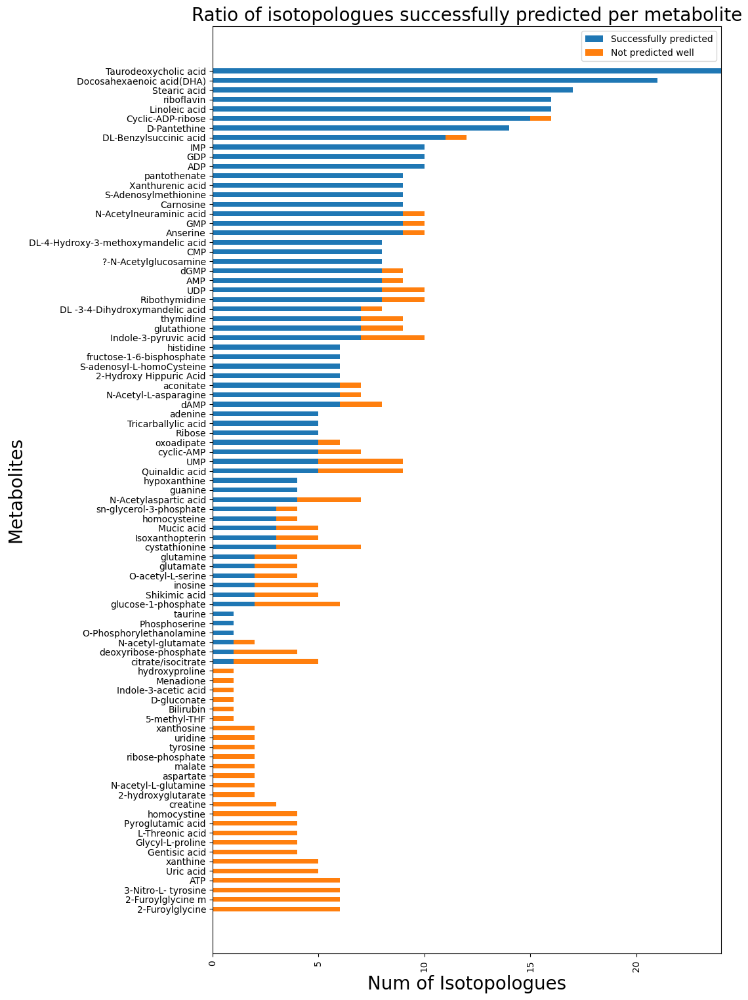

In [30]:
Brain_Glucose_IsoLearner_2.cross_validation_eval_metrics(ground_truth_Glucose_optimal, predictions_Glucose_optimal)

(122557, 585) (122557, 585)


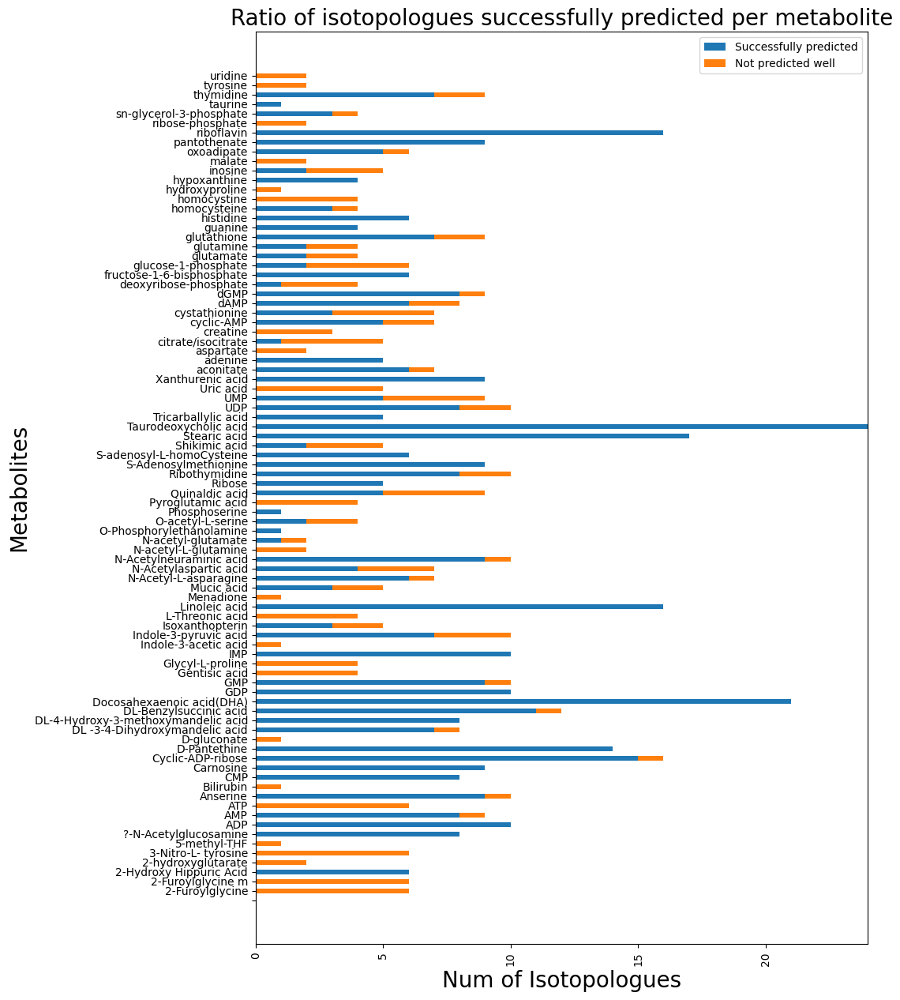

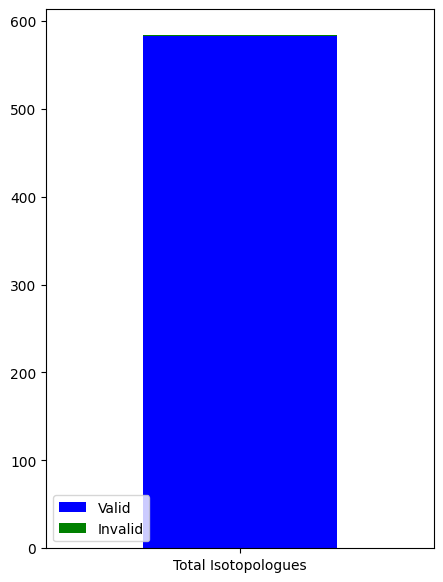

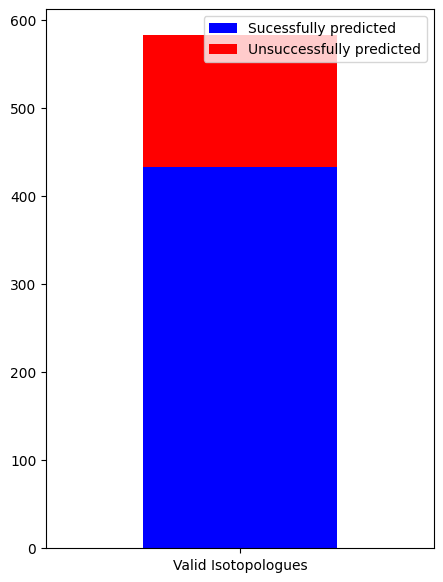

In [209]:
model_results = Brain_Glucose_IsoLearner_2.cross_validation_eval_metrics(ground_truth_Glucose_optimal, predictions_Glucose_optimal)

In [206]:
model_results.sort_values(by=["Median Rho"], ascending=False, inplace = True)

In [211]:
# Count rows where "Median Rho" > 0.6
count_greater_than_0_6 = len(model_results[model_results["R2"] > 0.3])

# Calculate the total number of rows in the DataFrame
total_rows = len(model_results)

# Calculate the percentage
percentage_greater_than_0_6 = (count_greater_than_0_6 / total_rows) * 100

print(total_rows)
print(f"Total rows with 'R2' > 0.6: {count_greater_than_0_6}")
print(f"Percentage of rows with 'R2' > 0.6: {percentage_greater_than_0_6}%")


583
Total rows with 'R2' > 0.6: 433
Percentage of rows with 'R2' > 0.6: 74.27101200686106%


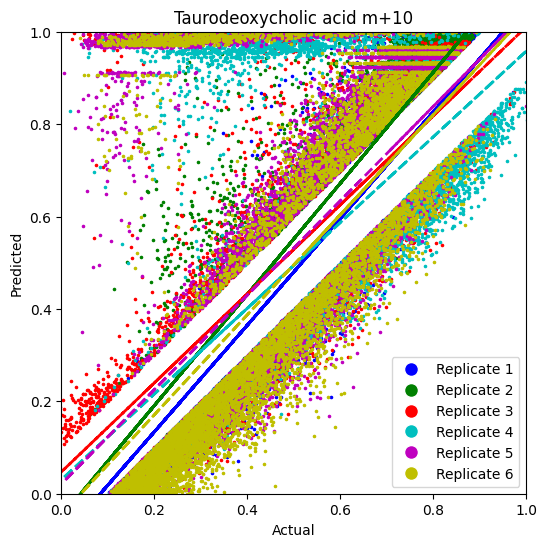

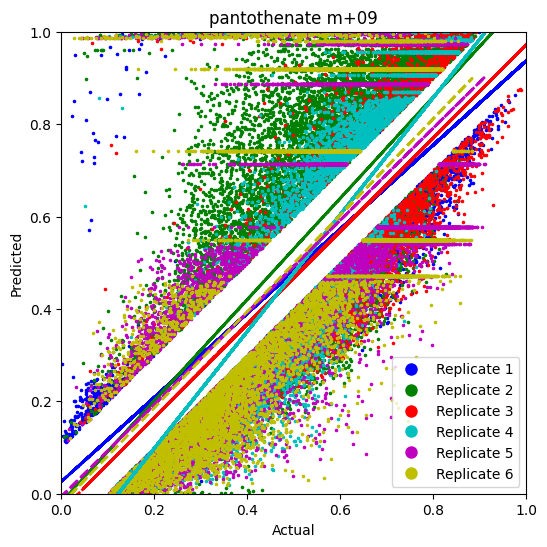

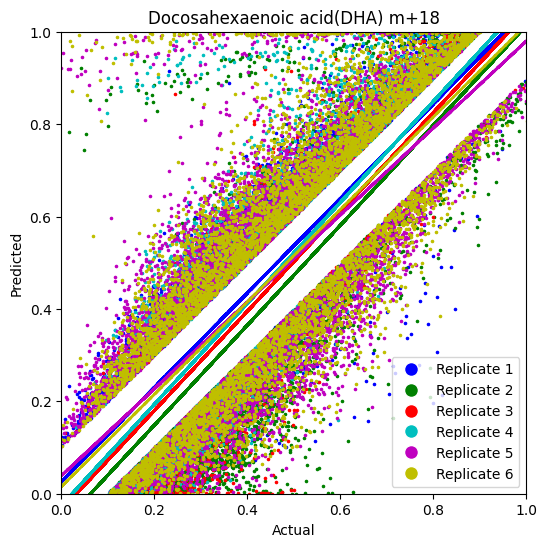

In [176]:
for isotopologue in ['Taurodeoxycholic acid m+10', 'pantothenate m+09', 'Docosahexaenoic acid(DHA) m+18']:
    Brain_Glucose_IsoLearner_2.scatterplot_replicates(ground_truth_Glucose_optimal, predictions_Glucose_optimal, isotopologue)

In [186]:
%pip install scikit-image

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 7.7 MB/s eta 0:00:0000:0100:01
  Using cached networkx-3.1-py3-none-any.whl (2.1 MB)
  Using cached imageio-2.31.3-py3-none-any.whl (313 kB)
  Using cached tifffile-2023.8.30-py3-none-any.whl (221 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 8.0 MB/s eta 0:00:00a 0:00:01m
  Using cached lazy_loader-0.3-py3-none-any.whl (9.1 kB)
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.

[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [187]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim

In [231]:
for isotopologue in ['Taurodeoxycholic acid m+10', 'pantothenate m+09', 'Docosahexaenoic acid(DHA) m+18', 'malate m+04', 'xanthine m+05', 'L-Threonic acid m+00']:
    print(isotopologue, Brain_Glucose_IsoLearner_2.structural_similarity_index(ground_truth_Glucose_optimal, predictions_Glucose_optimal, metabolite_name=isotopologue, replicate_index=3))

Taurodeoxycholic acid m+10 0.6506265012160476
pantothenate m+09 0.8142515431127998
Docosahexaenoic acid(DHA) m+18 0.8443924582662196
malate m+04 0.36813122556582284
xanthine m+05 0.3588791979140067
L-Threonic acid m+00 0.41023415493693405


In [223]:
model_results.sort_values(by=["Median Rho"], ascending=False, inplace = True)
display(model_results[500:])

,isotopologue,Median Rho,p-value,MSE,MAE,R2
500,xanthine m+05,0.4470,0.0000,0.0637,0.2095,0.2105
501,deoxyribose-phosphate m+02,0.4454,0.0000,0.0677,0.2169,0.1880
503,dGMP m+03,0.4437,0.0000,0.0666,0.2194,0.2012
502,AMP m+03,0.4437,0.0000,0.0666,0.2194,0.2012
504,glucose-1-phosphate m+00,0.4428,0.0000,0.0663,0.2193,0.2038
505,UMP m+00,0.4416,0.0000,0.0678,0.2181,0.1859
506,tyrosine m+00,0.4414,0.0000,0.0658,0.2109,0.1918
507,N-acetyl-glutamate m+00,0.4411,0.0000,0.0667,0.2178,0.1997
508,aspartate m+00,0.4381,0.0000,0.0663,0.2147,0.2049
509,inosine m+04,0.4375,0.0000,0.0679,0.2137,0.1848


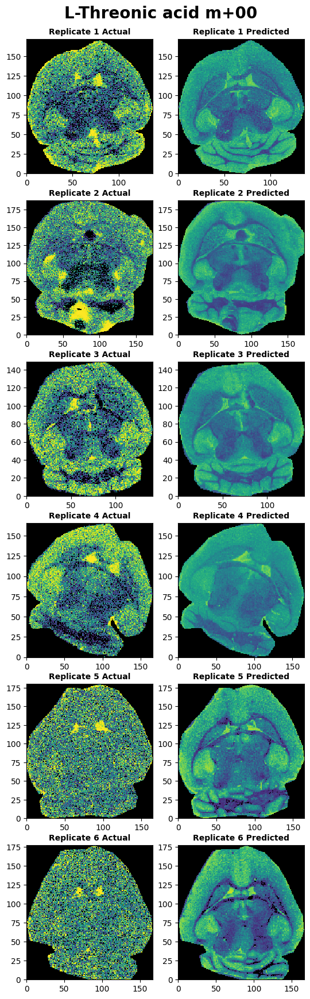

In [226]:
vis.cross_validation_results(ground_truth_Glucose_Morans3, predictions_Glucose_Morans3, coords_df=Brain_Glucose_IsoLearner.coords_df, iso_to_plot="L-Threonic acid m+00")

In [66]:
for i in range((6)):
    print(Brain_Glucose_IsoLearner_2.clean_ion_data[i].shape)

(17160, 343)
(24922, 343)
(16450, 343)
(19774, 343)
(22705, 343)
(21546, 343)


## Full Feature Evaluation

In [245]:
best_metabs = ["taurine", "aspartate", "citrate/isocitrate", "glutamate", "O-Phosphorylethanolamine", "sn-glycerol-3-phosphate", "N-Acetylaspartic acid", "Tricarballylic acid", "deoxyribose-phosphate", "?-N-Acetylglucosamine", "Carnosine", "Myristic acid", "Melatonin", "Anserine", "Ribothymidine", "glucose-1-phosphate", "Retinoic Acid", "elcosapentaenoic acid", "glutathione", "N-Acetylneuraminic acid", "Arachidic acid", "UMP", "Docosahexaenoic acid(DHA)", "fructose-1-6-bisphosphate", "AMP", "dGMP", "IMP", "riboflavin", "Lithocholic acid", "Chenodeoxycholic acid", "trehalose-6-Phosphate", "adenosine 5'-phosphosulfate", "ADP", "IDP", "Glycodeoxycholic acid", "Glycoursodeoxycholic acid", "dCTP", "dUTP", "dTTP", "CTP", "CDP-choline", "dATP", "Taurodeoxycholic acid", "Inosine 5-triphosphate", "D-Pantethine", "ADP-D-glucose", "NAD+", "NADH", "dephospho-CoA", "O-acetyl-L-serine"]

In [242]:
full_metabolites, full_isotopologues = Brain_Glucose_IsoLearner_2.create_full_dataset(Brain_Glucose_IsoLearner_2.clean_ion_data, Brain_Glucose_IsoLearner_2.clean_iso_data, holdout=False)

In [2]:
full_isotopologues

NameError: name 'full_isotopologues' is not defined

In [ ]:
# Example Implementation: 
# ===========================================================
print("Starting GCM Calculations") 
num_cols = len(best_metabs[0:3])
print(num_cols)
mutation_index = 0
gcm_output = [None] * num_cols # np.fromiter(np.zeros(num_cols), dtype=float)

all_mutations = full_metabolites.astype(float)  # The features (metabolites) that are being considered
Y_data = full_isotopologues.astype(float) # The targets (isotopologues)

y_data = Y_data.values # -> Outputs don't change over the various features we are testing. 
print(f'Y data shape: {y_data.shape}')

while mutation_index < num_cols: # -> Per Mutation (feature)
    print(mutation_index)
    X_data = (all_mutations.iloc[:,mutation_index]).values.reshape(-1,1)
    print(X_data.shape)
    
    #Calculate marginal p_values and if any of the columns of Y 
    # If there's zero correlation, we know there will be no dependence --> ask wes about this
    #r, p_value = pearsonr(X_data, y_data) # -> Skip any features or mutations that don't matter
    #if p_value < 0.05: 
    Z_data = all_mutations.drop(all_mutations.columns[mutation_index], axis=1)
    print(Z_data.shape)

    if False:
        # Get just the top 100 PCs as a quick sub for Z -> wanted to reduce calculations, PCA helps prevent overfitting
        pca = PCA(n_components=5) # -> PCA Decomposition to help reduce dimensionality and reduce overfitting by the models. 
        pca.fit(Z_data.T)
        pca_Z_data = pca.components_.T
    
    test_mutation_results = multi_gcm_test(X_data, y_data, Z_data, IsoLearner.NeuralNetRegressorX, IsoLearner.NeuralNetRegressorY) # -> Calling the actual test mutation method
    gcm_output[mutation_index] = test_mutation_results #p_value -> Saving Pvalue Results
    #else: 
    #    gcm_output[mutation_index] = 1

    if mutation_index % 50 == 0:
        print(mutation_index)
        #if gcm_output[mutation_index] < 1:
        #    print(gcm_output[mutation_index])
    mutation_index += 1

print("Finished")

## Other Tracers

### B15NGln

In [10]:
IsoLearner_B15NGln = IsoLearner.IsoLearner(
                                            absolute_data_path = "/Users/rbisram/Documents",
                                            relative_data_path = "brain-m0-no-log/Brain-15NGln",
                                            morans_path = 'Morans-values/brain-15NX-morans-iso.txt', 
                                            tracer = 'B15NGln',
                                            morans_strat = 2,
                                            morans_cutoff = 0.6,
                                            min_replicates = 2,
                                            shared_morans_file = True
)

Initializing IsoLearner
Cleaning data with strategy 2: ============> The dataset has been checked for inconsistencies
Inconsistencies found: 5 metabolites, 200 isotopolouges
File 0: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NGln/B15NGln-ND-M1-FML-ioncounts-ranks.csv || 0 to drop || 0 dropped
File 1: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NGln/B15NGln-ND-M2-FML-ioncounts-ranks.csv || 5 to drop || 5 dropped
File 2: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NGln/B15NGln-ND-M3-FML-ioncounts-ranks.csv || 5 to drop || 5 dropped
Ion-Data is all consistent! Time to train a model!

File 0: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NGln/B15NGln-ND-M1-FML-isotopolouges-ranks.csv || 2509 to drop || 2509 dropped
File 1: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NGln/B15NGln-ND-M2-FML-isotopolouges-ranks.csv || 2688 to drop || 2688 dropped
File 2: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NGln/B15NGln-ND-M3-FML-isotopolouges-ranks.csv || 2669 to drop || 2

WE ARE IN THIS FUNCTION
Creating checkpoint directory
Training with replicate 0 heldout. # samples = 21744
HI
Epoch 1/100
136/136 [==============================] - 2s 12ms/step - loss: 80.1042 - mse: 2.1665 - mae: 1.1651 - val_loss: 75.0271 - val_mse: 0.5851 - val_mae: 0.6186
Epoch 2/100
136/136 [==============================] - 2s 12ms/step - loss: 73.0117 - mse: 1.8391 - mae: 1.0699 - val_loss: 68.5928 - val_mse: 0.6574 - val_mae: 0.6528
Epoch 3/100
136/136 [==============================] - 2s 12ms/step - loss: 66.3286 - mse: 1.4175 - mae: 0.9326 - val_loss: 62.5473 - val_mse: 0.6351 - val_mae: 0.6386
Epoch 4/100
136/136 [==============================] - 2s 12ms/step - loss: 60.0598 - mse: 0.9702 - mae: 0.7741 - val_loss: 56.8125 - val_mse: 0.5334 - val_mae: 0.5893
Epoch 5/100
136/136 [==============================] - 2s 12ms/step - loss: 54.2974 - mse: 0.6717 - mae: 0.6529 - val_loss: 51.3959 - val_mse: 0.4099 - val_mae: 0.5267
Epoch 6/100
136/136 [=============================

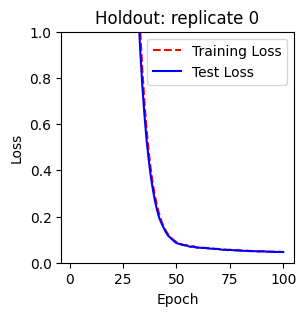

Training with replicate 1 heldout. # samples = 16496
HI
Epoch 1/100
104/104 [==============================] - 2s 13ms/step - loss: 80.9704 - mse: 2.2059 - mae: 1.1747 - val_loss: 76.5907 - val_mse: 0.5590 - val_mae: 0.6088
Epoch 2/100
104/104 [==============================] - 1s 11ms/step - loss: 75.4904 - mse: 1.9653 - mae: 1.1079 - val_loss: 71.6800 - val_mse: 0.7123 - val_mae: 0.6795
Epoch 3/100
104/104 [==============================] - 1s 11ms/step - loss: 70.3060 - mse: 1.7010 - mae: 1.0282 - val_loss: 66.9496 - val_mse: 0.7516 - val_mae: 0.6936
Epoch 4/100
104/104 [==============================] - 1s 12ms/step - loss: 65.3285 - mse: 1.3606 - mae: 0.9163 - val_loss: 62.3821 - val_mse: 0.6872 - val_mae: 0.6627
Epoch 5/100
104/104 [==============================] - 1s 12ms/step - loss: 60.5964 - mse: 1.0168 - mae: 0.7935 - val_loss: 57.9800 - val_mse: 0.5615 - val_mae: 0.6032
Epoch 6/100
104/104 [==============================] - 1s 12ms/step - loss: 56.1622 - mse: 0.7633 - mae:

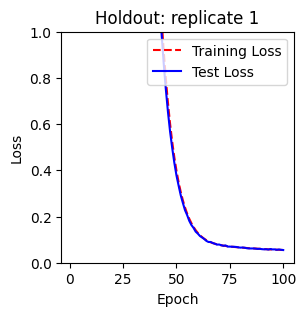

Training with replicate 2 heldout. # samples = 16496
HI
Epoch 1/100
104/104 [==============================] - 2s 12ms/step - loss: 80.9052 - mse: 2.2118 - mae: 1.1778 - val_loss: 76.5331 - val_mse: 0.5733 - val_mae: 0.6189
Epoch 2/100
104/104 [==============================] - 1s 11ms/step - loss: 75.4491 - mse: 1.9918 - mae: 1.1173 - val_loss: 71.6289 - val_mse: 0.7255 - val_mae: 0.6881
Epoch 3/100
104/104 [==============================] - 1s 12ms/step - loss: 70.3170 - mse: 1.7699 - mae: 1.0505 - val_loss: 66.8887 - val_mse: 0.7429 - val_mae: 0.6939
Epoch 4/100
104/104 [==============================] - 1s 11ms/step - loss: 65.4222 - mse: 1.4938 - mae: 0.9600 - val_loss: 62.4063 - val_mse: 0.7341 - val_mae: 0.6847
Epoch 5/100
104/104 [==============================] - 1s 12ms/step - loss: 60.7171 - mse: 1.1353 - mae: 0.8343 - val_loss: 58.1109 - val_mse: 0.6607 - val_mae: 0.6460
Epoch 6/100
104/104 [==============================] - 1s 12ms/step - loss: 56.2867 - mse: 0.8240 - mae:

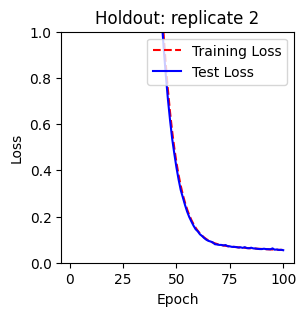

0

In [40]:
IsoLearner_B15NGln.cross_validation_training(checkpoints_dir_label = "B15NGln-Morans-optimal-model")

In [4]:
IsoLearner_B15NGln.actual, IsoLearner_B15NGln.predicted = IsoLearner_B15NGln.cross_validation_testing(checkpoints_dir_label = "B15NGln-Morans-optimal-model")

Testing with replicate 0 heldout. # samples = 16496
516/516 [==============================] - 1s 2ms/step
Testing with replicate 1 heldout. # samples = 21744
680/680 [==============================] - 1s 2ms/step
Testing with replicate 2 heldout. # samples = 11463
359/359 [==============================] - 1s 2ms/step


(49703, 745) (49703, 745)


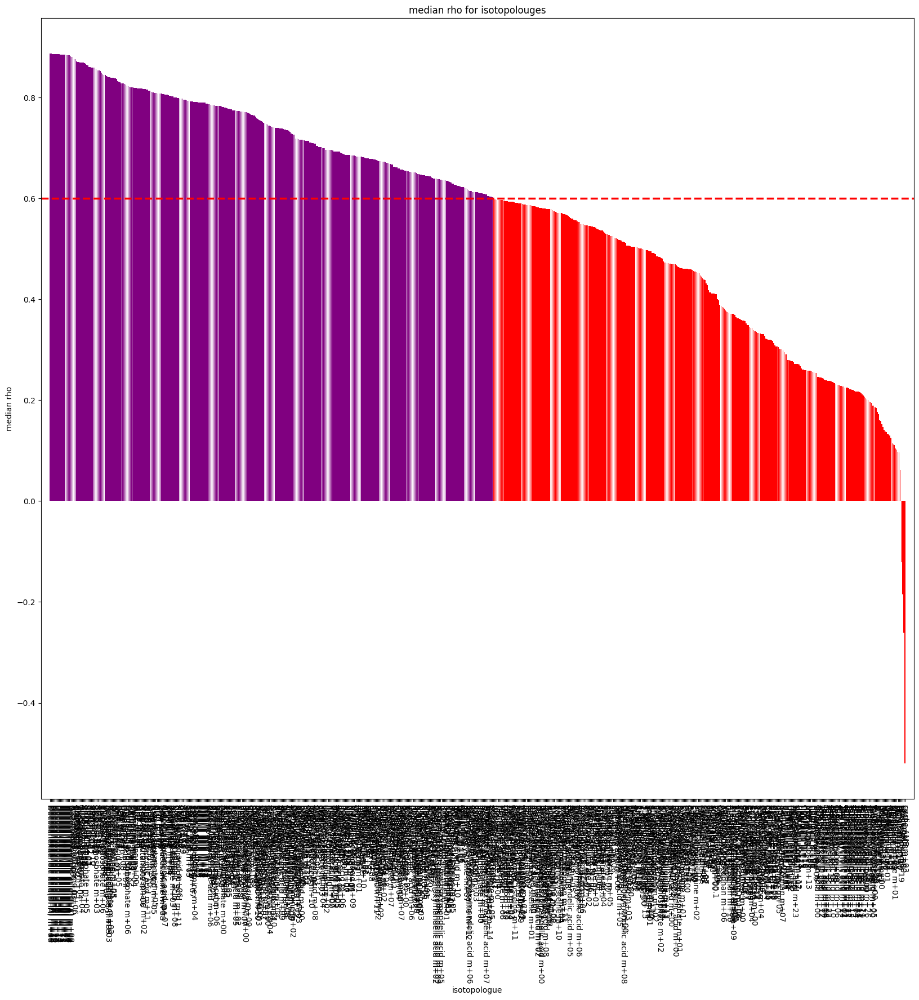

Done with spearmans


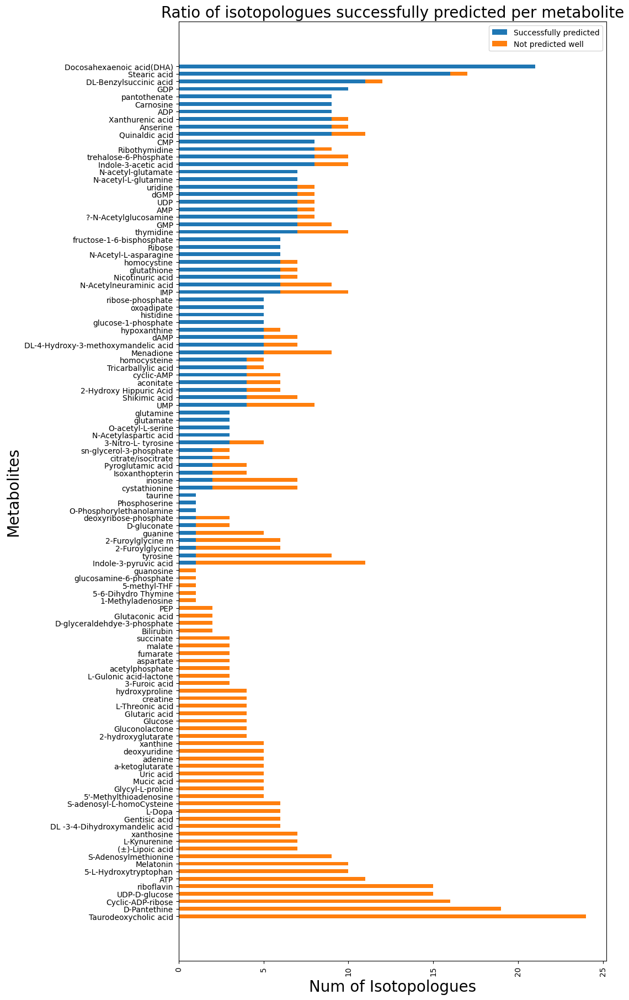

(             isotopologue  Median Rho  p-value     MSE     MAE      R2
 588       xanthosine m+10      0.3774      0.0  0.0790  0.2367  0.0513
 369       xanthosine m+09      0.6123      0.0  0.0588  0.1988  0.2941
 606       xanthosine m+08      0.3518      0.0  0.0802  0.2404  0.0372
 587       xanthosine m+06      0.3816      0.0  0.0786  0.2355  0.0570
 626       xanthosine m+04      0.3198      0.0  0.0823  0.2405  0.0121
 ..                    ...         ...      ...     ...     ...     ...
 390  (±)-Lipoic acid m+06      0.5968      0.0  0.0618  0.2031  0.2585
 392  (±)-Lipoic acid m+04      0.5967      0.0  0.0618  0.2034  0.2578
 386  (±)-Lipoic acid m+03      0.5983      0.0  0.0614  0.2021  0.2635
 399  (±)-Lipoic acid m+02      0.5938      0.0  0.0621  0.2029  0.2548
 496  (±)-Lipoic acid m+00      0.5169      0.0  0.0675  0.2197  0.1904
 
 [745 rows x 6 columns],
 {'xanthosine': [0, 7, 7],
  'xanthine': [0, 5, 5],
  'uridine': [7, 1, 8],
  'tyrosine': [1, 8, 9],
  'treha

In [60]:
IsoLearner_B15NGln.cross_validation_eval_metrics(IsoLearner_B15NGln.actual, IsoLearner_B15NGln.predicted)

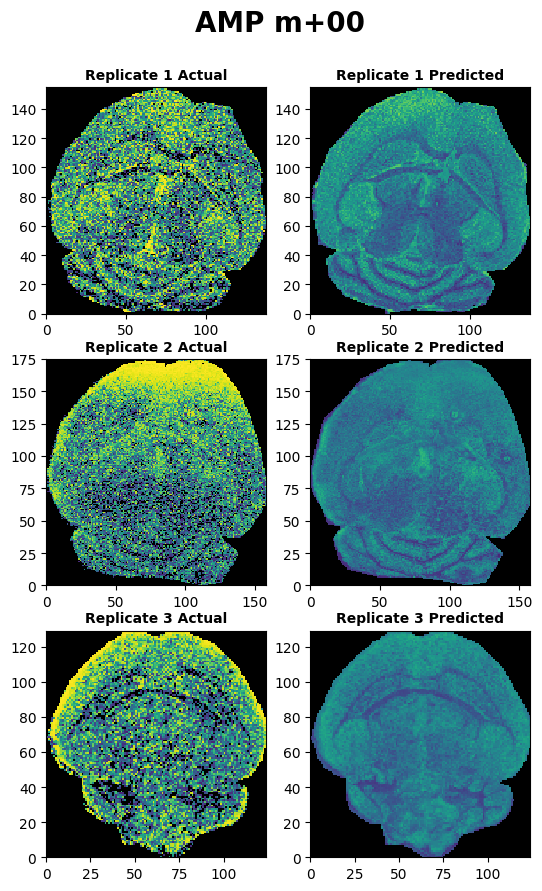

In [23]:
vis.cross_validation_results(IsoLearner_B15NGln.actual, IsoLearner_B15NGln.predicted, IsoLearner_B15NGln.coords_df, 'AMP m+00', limited=True)

### B15NLeu

In [9]:
IsoLearner_B15NLeu = IsoLearner.IsoLearner(
                                            absolute_data_path = "/Users/rbisram/Documents",
                                            relative_data_path = "brain-m0-no-log/Brain-15NLeu",
                                            morans_path = 'Morans-values/brain-15NX-morans-iso.txt', 
                                            tracer = 'B15NLeu',
                                            morans_strat = 2,
                                            morans_cutoff = 0.6,
                                            min_replicates = 2,
                                            shared_morans_file = True
)

Initializing IsoLearner
Cleaning data with strategy 2: ============> The dataset has been checked for inconsistencies
Inconsistencies found: 5 metabolites, 238 isotopolouges
File 0: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NLeu/B15NLeu-ND-M1-FML-ioncounts-ranks.csv || 0 to drop || 0 dropped
File 1: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NLeu/B15NLeu-ND-M2-FML-ioncounts-ranks.csv || 0 to drop || 0 dropped
File 2: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NLeu/B15NLeu-ND-M3-FML-ioncounts-ranks.csv || 5 to drop || 5 dropped
Ion-Data is all consistent! Time to train a model!

File 0: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NLeu/B15NLeu-ND-M1-FML-isotopolouges-ranks.csv || 2502 to drop || 2502 dropped
File 1: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NLeu/B15NLeu-ND-M2-FML-isotopolouges-ranks.csv || 2515 to drop || 2515 dropped
File 2: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NLeu/B15NLeu-ND-M3-FML-isotopolouges-ranks.csv || 2712 to drop || 2

WE ARE IN THIS FUNCTION
Creating checkpoint directory
Training with replicate 0 heldout. # samples = 16601
HI
Epoch 1/100
104/104 [==============================] - 2s 13ms/step - loss: 80.3059 - mse: 2.2078 - mae: 1.1748 - val_loss: 75.9940 - val_mse: 0.5663 - val_mae: 0.6120
Epoch 2/100
104/104 [==============================] - 1s 12ms/step - loss: 74.8843 - mse: 1.9676 - mae: 1.1077 - val_loss: 71.0850 - val_mse: 0.6922 - val_mae: 0.6701
Epoch 3/100
104/104 [==============================] - 1s 13ms/step - loss: 69.7292 - mse: 1.7069 - mae: 1.0278 - val_loss: 66.3360 - val_mse: 0.6944 - val_mae: 0.6705
Epoch 4/100
104/104 [==============================] - 1s 13ms/step - loss: 64.7838 - mse: 1.3766 - mae: 0.9189 - val_loss: 61.8335 - val_mse: 0.6722 - val_mae: 0.6558
Epoch 5/100
104/104 [==============================] - 1s 12ms/step - loss: 60.0633 - mse: 1.0201 - mae: 0.7928 - val_loss: 57.4940 - val_mse: 0.5860 - val_mae: 0.6138
Epoch 6/100
104/104 [=============================

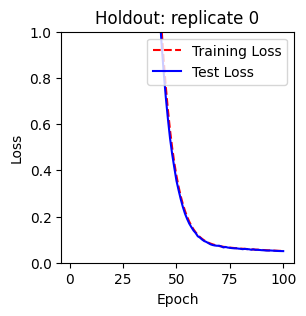

Training with replicate 1 heldout. # samples = 16306
HI
Epoch 1/100
102/102 [==============================] - 2s 11ms/step - loss: 80.3641 - mse: 2.2106 - mae: 1.1771 - val_loss: 76.0988 - val_mse: 0.5583 - val_mae: 0.6116
Epoch 2/100
102/102 [==============================] - 1s 11ms/step - loss: 75.0598 - mse: 1.9860 - mae: 1.1149 - val_loss: 71.2905 - val_mse: 0.6912 - val_mae: 0.6731
Epoch 3/100
102/102 [==============================] - 1s 11ms/step - loss: 70.0283 - mse: 1.7621 - mae: 1.0482 - val_loss: 66.6347 - val_mse: 0.7078 - val_mae: 0.6788
Epoch 4/100
102/102 [==============================] - 1s 11ms/step - loss: 65.2241 - mse: 1.5008 - mae: 0.9640 - val_loss: 62.2037 - val_mse: 0.6889 - val_mae: 0.6670
Epoch 5/100
102/102 [==============================] - 1s 11ms/step - loss: 60.6173 - mse: 1.1853 - mae: 0.8545 - val_loss: 57.9689 - val_mse: 0.6272 - val_mae: 0.6354
Epoch 6/100
102/102 [==============================] - 1s 11ms/step - loss: 56.2410 - mse: 0.8775 - mae:

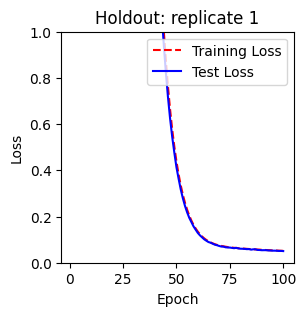

Training with replicate 2 heldout. # samples = 16306
HI
Epoch 1/100
102/102 [==============================] - 2s 12ms/step - loss: 80.4147 - mse: 2.2076 - mae: 1.1753 - val_loss: 76.1420 - val_mse: 0.5520 - val_mae: 0.6071
Epoch 2/100
102/102 [==============================] - 1s 11ms/step - loss: 75.0950 - mse: 1.9735 - mae: 1.1099 - val_loss: 71.3217 - val_mse: 0.6763 - val_mae: 0.6643
Epoch 3/100
102/102 [==============================] - 1s 11ms/step - loss: 70.0254 - mse: 1.7140 - mae: 1.0310 - val_loss: 66.6781 - val_mse: 0.7060 - val_mae: 0.6741
Epoch 4/100
102/102 [==============================] - 1s 11ms/step - loss: 65.1483 - mse: 1.3805 - mae: 0.9214 - val_loss: 62.2296 - val_mse: 0.6720 - val_mae: 0.6533
Epoch 5/100
102/102 [==============================] - 1s 11ms/step - loss: 60.4852 - mse: 1.0177 - mae: 0.7913 - val_loss: 57.9157 - val_mse: 0.5505 - val_mae: 0.5978
Epoch 6/100
102/102 [==============================] - 1s 11ms/step - loss: 56.1160 - mse: 0.7487 - mae:

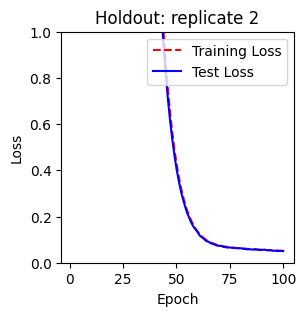

Testing with replicate 0 heldout. # samples = 16306
510/510 [==============================] - 1s 1ms/step
Testing with replicate 1 heldout. # samples = 16601
519/519 [==============================] - 1s 1ms/step
Testing with replicate 2 heldout. # samples = 16422
514/514 [==============================] - 1s 1ms/step


In [32]:
IsoLearner_B15NLeu.cross_validation_training(checkpoints_dir_label = "B15NLeu-Morans-optimal-model")
IsoLearner_B15NLeu.actual, IsoLearner_B15NLeu.predicted = IsoLearner_B15NLeu.cross_validation_testing(checkpoints_dir_label = "B15NLeu-Morans-optimal-model")

(49329, 712) (49329, 712)


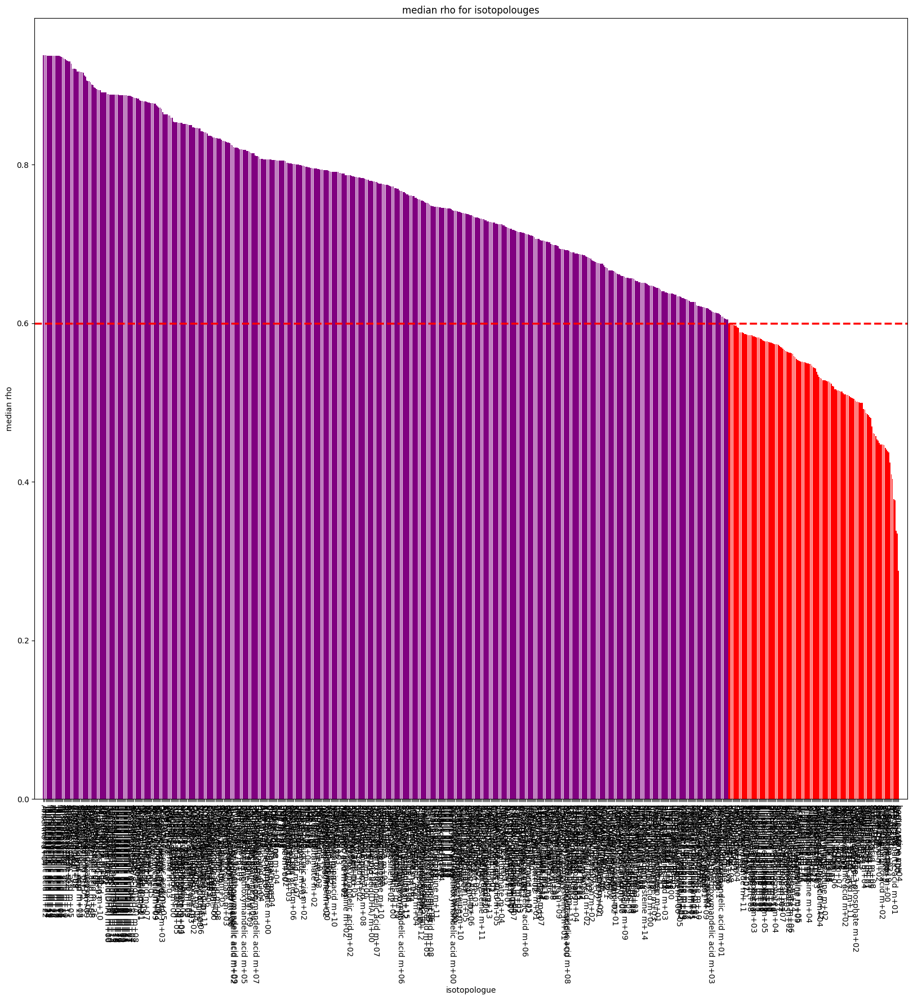

Done with spearmans


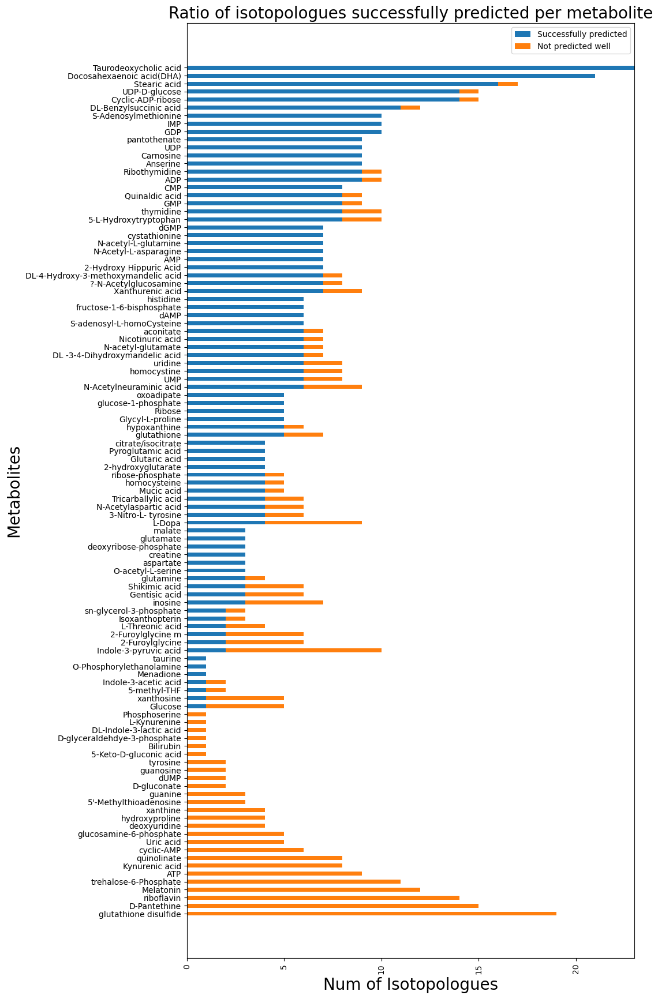

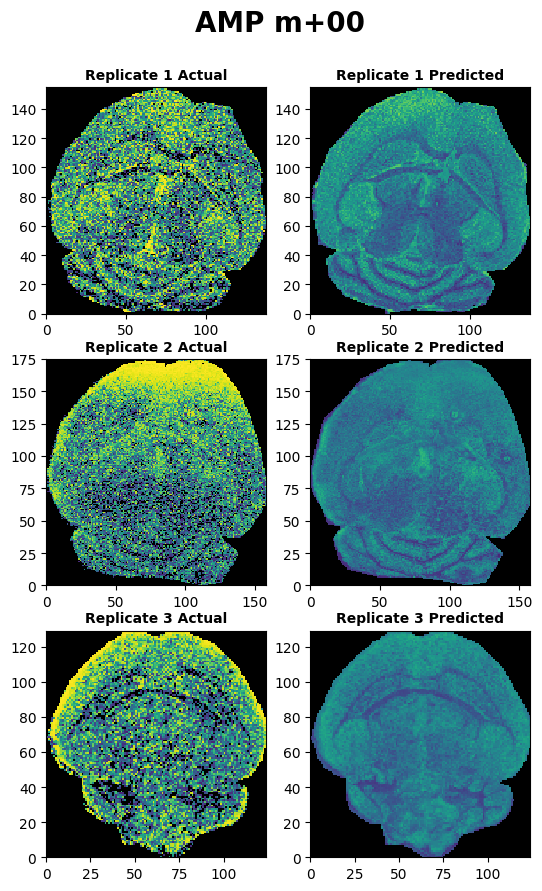

In [33]:
IsoLearner_B15NLeu.cross_validation_eval_metrics(IsoLearner_B15NLeu.actual, IsoLearner_B15NLeu.predicted)
vis.cross_validation_results(IsoLearner_B15NGln.actual, IsoLearner_B15NGln.predicted, IsoLearner_B15NGln.coords_df, 'AMP m+00', limited=True)

### B15NNH4Cl

In [8]:
IsoLearner_B15NNH4Cl = IsoLearner.IsoLearner(
                                            absolute_data_path = "/Users/rbisram/Documents",
                                            relative_data_path = "brain-m0-no-log/Brain-15NNH4Cl",
                                            morans_path = 'Morans-values/brain-15NX-morans-iso.txt', 
                                            tracer = 'B15NNH4Cl',
                                            morans_strat = 2,
                                            morans_cutoff = 0.6,
                                            min_replicates = 2,
                                            shared_morans_file = True
)

Initializing IsoLearner
Cleaning data with strategy 2: ============> The dataset has been checked for inconsistencies
Inconsistencies found: 5 metabolites, 230 isotopolouges
File 0: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NNH4Cl/B15NNH4Cl-ND-M1-FML-ioncounts-ranks.csv || 0 to drop || 0 dropped
File 1: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NNH4Cl/B15NNH4Cl-ND-M2-FML-ioncounts-ranks.csv || 0 to drop || 0 dropped
File 2: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NNH4Cl/B15NNH4Cl-ND-M3-FML-ioncounts-ranks.csv || 5 to drop || 5 dropped
Ion-Data is all consistent! Time to train a model!

File 0: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NNH4Cl/B15NNH4Cl-ND-M1-FML-isotopolouges-ranks.csv || 2473 to drop || 2473 dropped
File 1: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NNH4Cl/B15NNH4Cl-ND-M2-FML-isotopolouges-ranks.csv || 2482 to drop || 2482 dropped
File 2: /Users/rbisram/Documents/brain-m0-no-log/Brain-15NNH4Cl/B15NNH4Cl-ND-M3-FML-isotopolouges-ranks.

WE ARE IN THIS FUNCTION
Creating checkpoint directory
Training with replicate 0 heldout. # samples = 17371
HI
Epoch 1/100
109/109 [==============================] - 2s 14ms/step - loss: 81.0149 - mse: 2.1926 - mae: 1.1700 - val_loss: 76.5191 - val_mse: 0.5578 - val_mae: 0.6082
Epoch 2/100
109/109 [==============================] - 1s 12ms/step - loss: 75.2209 - mse: 1.9325 - mae: 1.0951 - val_loss: 71.2943 - val_mse: 0.6929 - val_mae: 0.6724
Epoch 3/100
109/109 [==============================] - 1s 12ms/step - loss: 69.7081 - mse: 1.6148 - mae: 0.9961 - val_loss: 66.2687 - val_mse: 0.6971 - val_mae: 0.6723
Epoch 4/100
109/109 [==============================] - 1s 12ms/step - loss: 64.4464 - mse: 1.2377 - mae: 0.8726 - val_loss: 61.4675 - val_mse: 0.6424 - val_mae: 0.6448
Epoch 5/100
109/109 [==============================] - 1s 12ms/step - loss: 59.4989 - mse: 0.9174 - mae: 0.7566 - val_loss: 56.8614 - val_mse: 0.5451 - val_mae: 0.5973
Epoch 6/100
109/109 [=============================

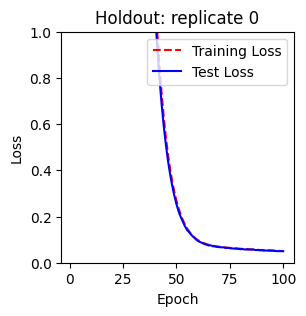

Training with replicate 1 heldout. # samples = 18225
HI
Epoch 1/100
114/114 [==============================] - 2s 13ms/step - loss: 80.9658 - mse: 2.1940 - mae: 1.1709 - val_loss: 76.3732 - val_mse: 0.5760 - val_mae: 0.6190
Epoch 2/100
114/114 [==============================] - 1s 12ms/step - loss: 74.9369 - mse: 1.9381 - mae: 1.0996 - val_loss: 70.9083 - val_mse: 0.7030 - val_mae: 0.6769
Epoch 3/100
114/114 [==============================] - 2s 13ms/step - loss: 69.2358 - mse: 1.6554 - mae: 1.0133 - val_loss: 65.6890 - val_mse: 0.7260 - val_mae: 0.6826
Epoch 4/100
114/114 [==============================] - 1s 12ms/step - loss: 63.7894 - mse: 1.2841 - mae: 0.8884 - val_loss: 60.7018 - val_mse: 0.6503 - val_mae: 0.6440
Epoch 5/100
114/114 [==============================] - 1s 12ms/step - loss: 58.6448 - mse: 0.9109 - mae: 0.7509 - val_loss: 55.9292 - val_mse: 0.5167 - val_mae: 0.5804
Epoch 6/100
114/114 [==============================] - 1s 12ms/step - loss: 53.8816 - mse: 0.6687 - mae:

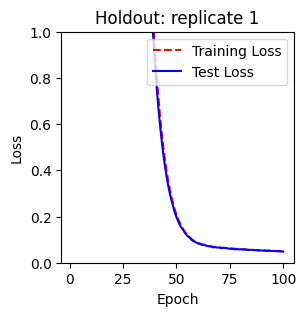

Training with replicate 2 heldout. # samples = 18225
HI
Epoch 1/100
114/114 [==============================] - 2s 14ms/step - loss: 80.9967 - mse: 2.1878 - mae: 1.1665 - val_loss: 76.3994 - val_mse: 0.5615 - val_mae: 0.6106
Epoch 2/100
114/114 [==============================] - 1s 11ms/step - loss: 74.9716 - mse: 1.9275 - mae: 1.0934 - val_loss: 70.9341 - val_mse: 0.6773 - val_mae: 0.6648
Epoch 3/100
114/114 [==============================] - 1s 12ms/step - loss: 69.2672 - mse: 1.6261 - mae: 0.9992 - val_loss: 65.6999 - val_mse: 0.6660 - val_mae: 0.6573
Epoch 4/100
114/114 [==============================] - 1s 12ms/step - loss: 63.8232 - mse: 1.2394 - mae: 0.8705 - val_loss: 60.7573 - val_mse: 0.6229 - val_mae: 0.6315
Epoch 5/100
114/114 [==============================] - 1s 11ms/step - loss: 58.7019 - mse: 0.8856 - mae: 0.7409 - val_loss: 56.0021 - val_mse: 0.5086 - val_mae: 0.5772
Epoch 6/100
114/114 [==============================] - 1s 11ms/step - loss: 53.9553 - mse: 0.6636 - mae:

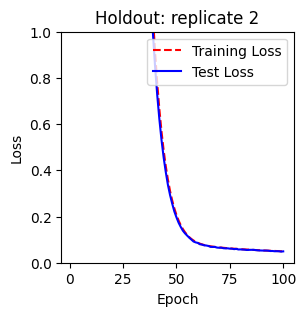

Testing with replicate 0 heldout. # samples = 18225
570/570 [==============================] - 1s 1ms/step
Testing with replicate 1 heldout. # samples = 17371
543/543 [==============================] - 1s 1ms/step
Testing with replicate 2 heldout. # samples = 16837
527/527 [==============================] - 1s 1ms/step


In [36]:
IsoLearner_B15NNH4Cl.cross_validation_training(checkpoints_dir_label = "B15NNH4Cl-Morans-optimal-model")
IsoLearner_B15NNH4Cl.actual, IsoLearner_B15NNH4Cl.predicted = IsoLearner_B15NNH4Cl.cross_validation_testing(checkpoints_dir_label = "B15NNH4Cl-Morans-optimal-model")

(52433, 760) (52433, 760)


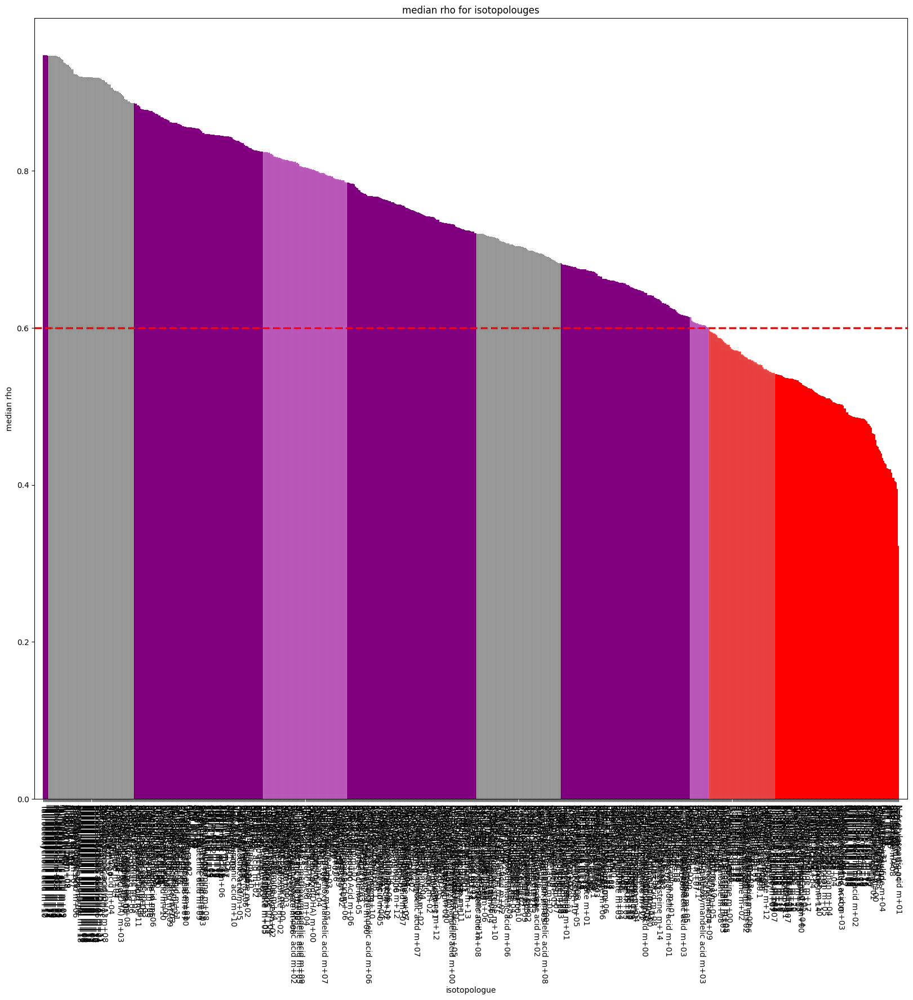

Done with spearmans


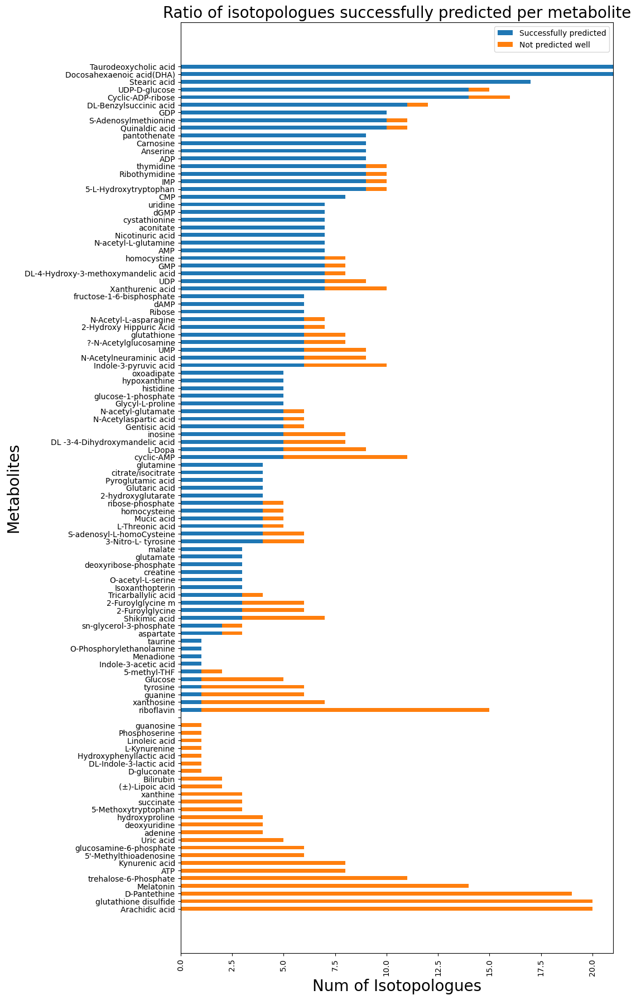

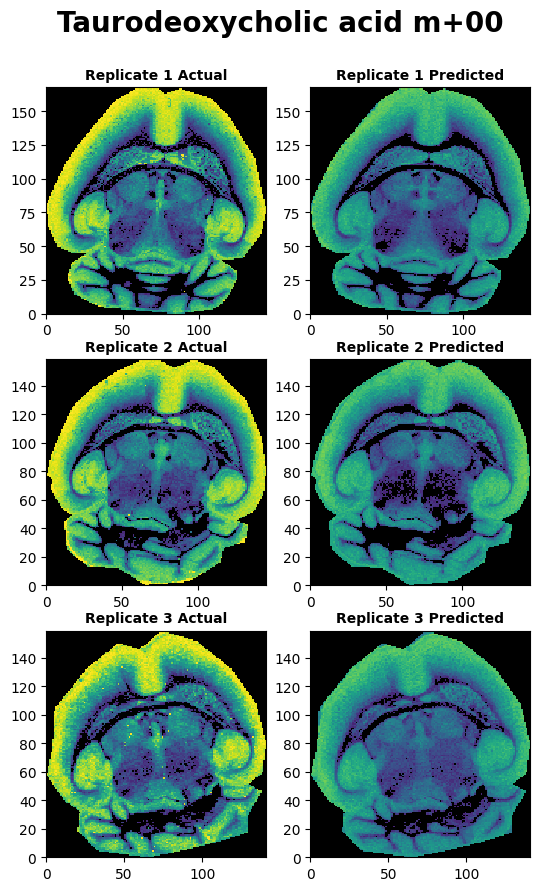

In [38]:
IsoLearner_B15NNH4Cl.cross_validation_eval_metrics(IsoLearner_B15NNH4Cl.actual, IsoLearner_B15NNH4Cl.predicted)
vis.cross_validation_results(IsoLearner_B15NNH4Cl.actual, IsoLearner_B15NNH4Cl.predicted, IsoLearner_B15NNH4Cl.coords_df, 'Taurodeoxycholic acid m+00', limited=True)

### B3HB

In [20]:
IsoLearner_B3HB = IsoLearner.IsoLearner(
                                            absolute_data_path = "/Users/rbisram/Documents",
                                            relative_data_path = "brain-m0-no-log/Brain-3HB",
                                            morans_path = 'Morans-values/brain-3HB-morans-iso.txt', 
                                            tracer = 'B3HB',
                                            morans_strat = 2,
                                            morans_cutoff = 0.6,
                                            min_replicates = 4,
                                            shared_morans_file = True
)

Initializing IsoLearner
Cleaning data with strategy 2: ========================> The dataset has been checked for inconsistencies
Inconsistencies found: 10 metabolites, 301 isotopolouges
File 0: /Users/rbisram/Documents/brain-m0-no-log/Brain-3HB/B3HB-ND-M1-FML-ioncounts-ranks.csv || 10 to drop || 10 dropped
File 1: /Users/rbisram/Documents/brain-m0-no-log/Brain-3HB/B3HB-ND-M2-FML-ioncounts-ranks.csv || 10 to drop || 10 dropped
File 2: /Users/rbisram/Documents/brain-m0-no-log/Brain-3HB/B3HB-ND-M3-FML-ioncounts-ranks.csv || 10 to drop || 10 dropped
File 3: /Users/rbisram/Documents/brain-m0-no-log/Brain-3HB/B3HB-KD-M1-FML-ioncounts-ranks.csv || 0 to drop || 0 dropped
File 4: /Users/rbisram/Documents/brain-m0-no-log/Brain-3HB/B3HB-KD-M2-FML-ioncounts-ranks.csv || 0 to drop || 0 dropped
File 5: /Users/rbisram/Documents/brain-m0-no-log/Brain-3HB/B3HB-KD-M3-FML-ioncounts-ranks.csv || 0 to drop || 0 dropped
Ion-Data is all consistent! Time to train a model!

File 0: /Users/rbisram/Documents/br

WE ARE IN THIS FUNCTION
Creating checkpoint directory
Training with replicate 0 heldout. # samples = 84722
HI
Epoch 1/40
530/530 [==============================] - 6s 11ms/step - loss: 65.7091 - mse: 1.5702 - mae: 0.9721 - val_loss: 54.5211 - val_mse: 0.4695 - val_mae: 0.5539
Epoch 2/40
530/530 [==============================] - 6s 11ms/step - loss: 45.7585 - mse: 0.4955 - mae: 0.5649 - val_loss: 37.3728 - val_mse: 0.2896 - val_mae: 0.4578
Epoch 3/40
530/530 [==============================] - 6s 12ms/step - loss: 30.6498 - mse: 0.3084 - mae: 0.4601 - val_loss: 24.4750 - val_mse: 0.2282 - val_mae: 0.4060
Epoch 4/40
530/530 [==============================] - 6s 11ms/step - loss: 19.6641 - mse: 0.2263 - mae: 0.3942 - val_loss: 15.3407 - val_mse: 0.1743 - val_mae: 0.3482
Epoch 5/40
530/530 [==============================] - 6s 11ms/step - loss: 12.0666 - mse: 0.1636 - mae: 0.3316 - val_loss: 9.1808 - val_mse: 0.1318 - val_mae: 0.2974
Epoch 6/40
530/530 [==============================] - 6s

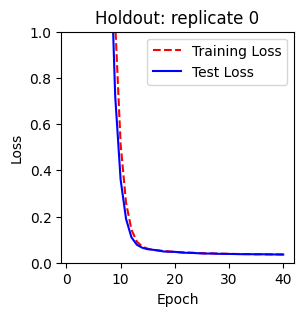

Training with replicate 1 heldout. # samples = 78421
HI
Epoch 1/40
491/491 [==============================] - 6s 11ms/step - loss: 66.6219 - mse: 1.6464 - mae: 0.9996 - val_loss: 56.0897 - val_mse: 0.5481 - val_mae: 0.5951
Epoch 2/40
491/491 [==============================] - 5s 10ms/step - loss: 47.8611 - mse: 0.5776 - mae: 0.6031 - val_loss: 39.8013 - val_mse: 0.3047 - val_mae: 0.4667
Epoch 3/40
491/491 [==============================] - 6s 11ms/step - loss: 33.2598 - mse: 0.3329 - mae: 0.4755 - val_loss: 27.1411 - val_mse: 0.2431 - val_mae: 0.4209
Epoch 4/40
491/491 [==============================] - 5s 10ms/step - loss: 22.2692 - mse: 0.2477 - mae: 0.4128 - val_loss: 17.8167 - val_mse: 0.1952 - val_mae: 0.3719
Epoch 5/40
491/491 [==============================] - 5s 10ms/step - loss: 14.3523 - mse: 0.1852 - mae: 0.3541 - val_loss: 11.2458 - val_mse: 0.1527 - val_mae: 0.3228
Epoch 6/40
491/491 [==============================] - 5s 10ms/step - loss: 8.8819 - mse: 0.1369 - mae: 0.3009

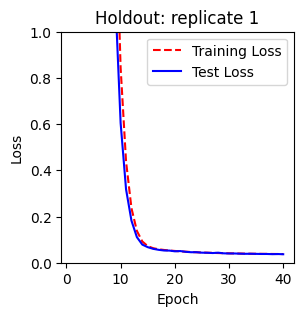

Training with replicate 2 heldout. # samples = 85668
HI
Epoch 1/40
536/536 [==============================] - 6s 11ms/step - loss: 65.5647 - mse: 1.5748 - mae: 0.9785 - val_loss: 54.2772 - val_mse: 0.5110 - val_mae: 0.5795
Epoch 2/40
536/536 [==============================] - 6s 10ms/step - loss: 45.4152 - mse: 0.5140 - mae: 0.5759 - val_loss: 36.9615 - val_mse: 0.2958 - val_mae: 0.4636
Epoch 3/40
536/536 [==============================] - 6s 11ms/step - loss: 30.2139 - mse: 0.3084 - mae: 0.4602 - val_loss: 24.0338 - val_mse: 0.2285 - val_mae: 0.4084
Epoch 4/40
536/536 [==============================] - 6s 10ms/step - loss: 19.2374 - mse: 0.2231 - mae: 0.3921 - val_loss: 14.9425 - val_mse: 0.1745 - val_mae: 0.3500
Epoch 5/40
536/536 [==============================] - 6s 10ms/step - loss: 11.7006 - mse: 0.1596 - mae: 0.3278 - val_loss: 8.8554 - val_mse: 0.1296 - val_mae: 0.2954
Epoch 6/40
536/536 [==============================] - 6s 10ms/step - loss: 6.7710 - mse: 0.1154 - mae: 0.2753 

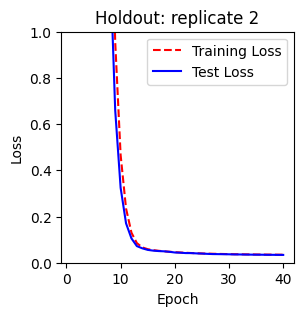

Training with replicate 3 heldout. # samples = 76717
HI
Epoch 1/40
480/480 [==============================] - 7s 13ms/step - loss: 66.8695 - mse: 1.6781 - mae: 1.0092 - val_loss: 56.5446 - val_mse: 0.5503 - val_mae: 0.5961
Epoch 2/40
480/480 [==============================] - 5s 11ms/step - loss: 48.4871 - mse: 0.5843 - mae: 0.6061 - val_loss: 40.5677 - val_mse: 0.3137 - val_mae: 0.4746
Epoch 3/40
480/480 [==============================] - 5s 11ms/step - loss: 34.0797 - mse: 0.3361 - mae: 0.4784 - val_loss: 28.0031 - val_mse: 0.2491 - val_mae: 0.4262
Epoch 4/40
480/480 [==============================] - 5s 11ms/step - loss: 23.1173 - mse: 0.2525 - mae: 0.4170 - val_loss: 18.6411 - val_mse: 0.2007 - val_mae: 0.3770
Epoch 5/40
480/480 [==============================] - 5s 11ms/step - loss: 15.1228 - mse: 0.1906 - mae: 0.3594 - val_loss: 11.9534 - val_mse: 0.1542 - val_mae: 0.3243
Epoch 6/40
480/480 [==============================] - 5s 10ms/step - loss: 9.5203 - mse: 0.1412 - mae: 0.3059

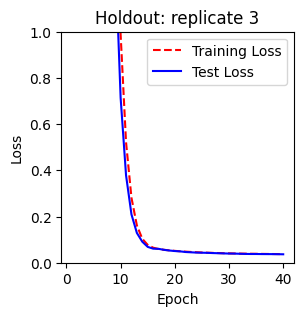

Training with replicate 4 heldout. # samples = 77280
HI
Epoch 1/40
483/483 [==============================] - 5s 10ms/step - loss: 66.7409 - mse: 1.7049 - mae: 1.0228 - val_loss: 56.3326 - val_mse: 0.6055 - val_mae: 0.6229
Epoch 2/40
483/483 [==============================] - 5s 10ms/step - loss: 48.1573 - mse: 0.6022 - mae: 0.6160 - val_loss: 40.1794 - val_mse: 0.3156 - val_mae: 0.4751
Epoch 3/40
483/483 [==============================] - 5s 10ms/step - loss: 33.6632 - mse: 0.3368 - mae: 0.4793 - val_loss: 27.5819 - val_mse: 0.2470 - val_mae: 0.4252
Epoch 4/40
483/483 [==============================] - 5s 10ms/step - loss: 22.7017 - mse: 0.2499 - mae: 0.4154 - val_loss: 18.2472 - val_mse: 0.1970 - val_mae: 0.3742
Epoch 5/40
483/483 [==============================] - 5s 10ms/step - loss: 14.7527 - mse: 0.1867 - mae: 0.3563 - val_loss: 11.6199 - val_mse: 0.1522 - val_mae: 0.3230
Epoch 6/40
483/483 [==============================] - 5s 10ms/step - loss: 9.2169 - mse: 0.1376 - mae: 0.3022

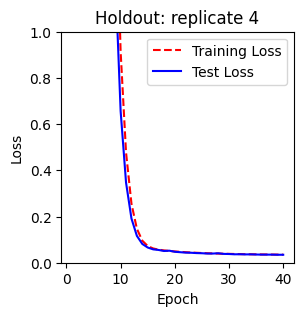

Training with replicate 5 heldout. # samples = 77280
HI
Epoch 1/40
483/483 [==============================] - 5s 10ms/step - loss: 66.7468 - mse: 1.6979 - mae: 1.0189 - val_loss: 56.3344 - val_mse: 0.5884 - val_mae: 0.6149
Epoch 2/40
483/483 [==============================] - 5s 10ms/step - loss: 48.1633 - mse: 0.5962 - mae: 0.6125 - val_loss: 40.1828 - val_mse: 0.3126 - val_mae: 0.4744
Epoch 3/40
483/483 [==============================] - 5s 10ms/step - loss: 33.6669 - mse: 0.3357 - mae: 0.4779 - val_loss: 27.5844 - val_mse: 0.2444 - val_mae: 0.4229
Epoch 4/40
483/483 [==============================] - 5s 10ms/step - loss: 22.7081 - mse: 0.2497 - mae: 0.4152 - val_loss: 18.2544 - val_mse: 0.1959 - val_mae: 0.3730
Epoch 5/40
483/483 [==============================] - 5s 10ms/step - loss: 14.7636 - mse: 0.1876 - mae: 0.3573 - val_loss: 11.6321 - val_mse: 0.1534 - val_mae: 0.3239
Epoch 6/40
483/483 [==============================] - 5s 10ms/step - loss: 9.2304 - mse: 0.1392 - mae: 0.3040

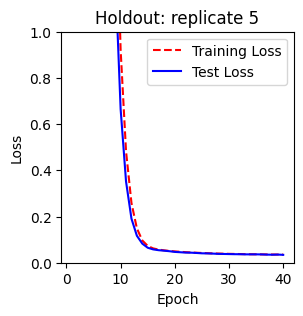

0

In [21]:
IsoLearner_B3HB.cross_validation_training(checkpoints_dir_label = "B3HB-Morans-optimal-model", EPOCHS = 40)

In [24]:
IsoLearner_B3HB.actual, IsoLearner_B3HB.predicted = IsoLearner_B3HB.cross_validation_testing(checkpoints_dir_label = "B3HB-Morans-optimal-model")

Testing with replicate 0 heldout. # samples = 15980
500/500 [==============================] - 1s 1ms/step
Testing with replicate 1 heldout. # samples = 22281
697/697 [==============================] - 1s 1ms/step
Testing with replicate 2 heldout. # samples = 15034
470/470 [==============================] - 1s 1ms/step
Testing with replicate 3 heldout. # samples = 23985
750/750 [==============================] - 1s 1ms/step
Testing with replicate 4 heldout. # samples = 23422
732/732 [==============================] - 1s 1ms/step
Testing with replicate 5 heldout. # samples = 22893
716/716 [==============================] - 1s 1ms/step


(123595, 425) (123595, 425)


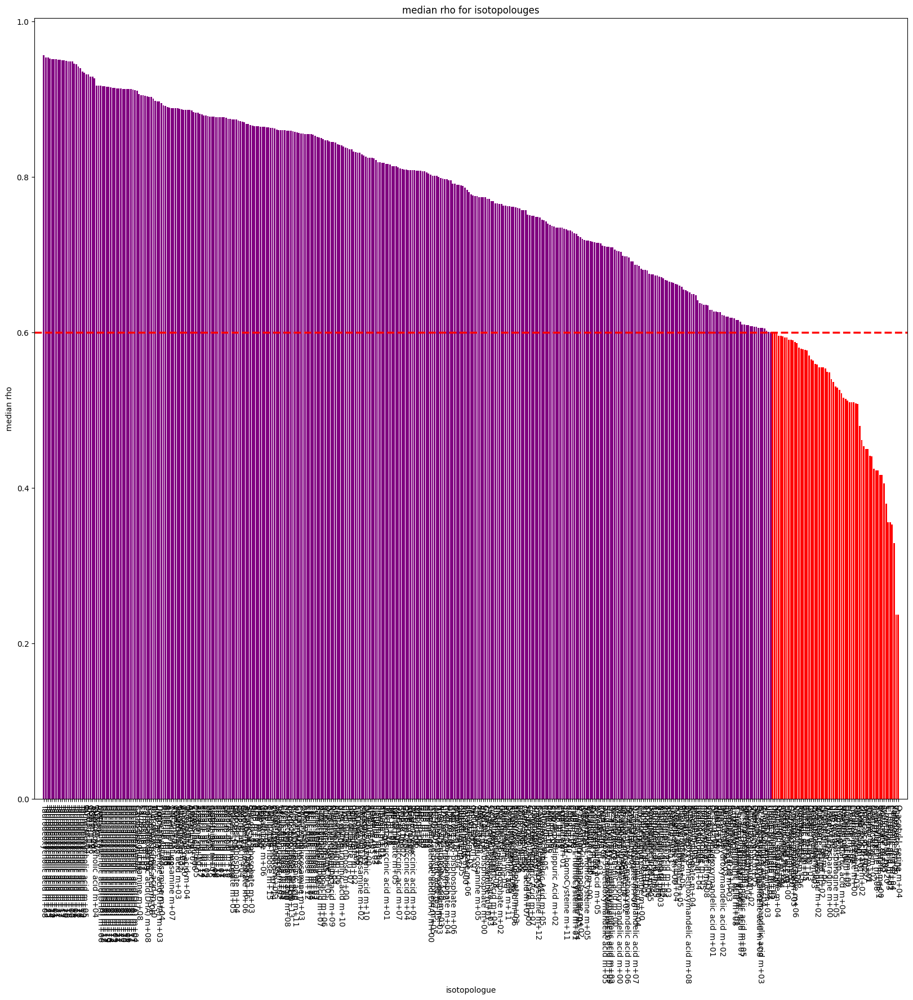

Done with spearmans


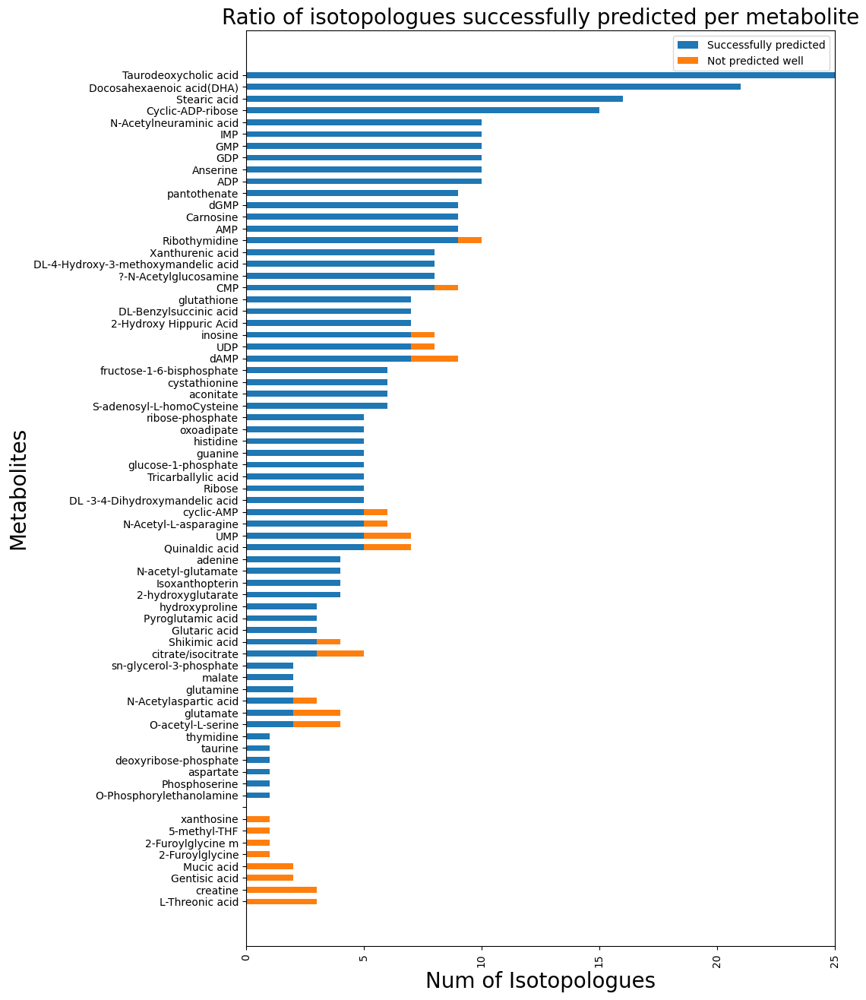

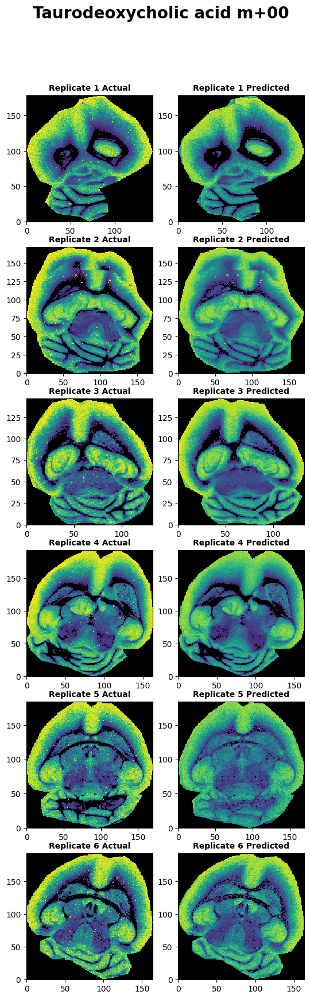

In [19]:
IsoLearner_B3HB.cross_validation_eval_metrics(IsoLearner_B3HB.actual, IsoLearner_B3HB.predicted)
vis.cross_validation_results(IsoLearner_B3HB.actual, IsoLearner_B3HB.predicted, IsoLearner_B3HB.coords_df, 'Taurodeoxycholic acid m+00', limited=True)

### Multiple Tracer

In [27]:
IsoLearner_Objects = [Brain_Glucose_IsoLearner_2, IsoLearner_B3HB, IsoLearner_B15NGln, IsoLearner_B15NLeu, IsoLearner_B15NNH4Cl]
tracers = ["Glucose", "B3HB", "B15NGln", "B15NLeu", "B15NNH4Cl"]

In [28]:
dicts = IsoLearner.compare_tracers(IsoLearner_Objects, tracers)

Glucose
Testing with replicate 0 heldout. # samples = 17160
537/537 [==============================] - 1s 1ms/step
Testing with replicate 1 heldout. # samples = 24922
779/779 [==============================] - 1s 1ms/step
Testing with replicate 2 heldout. # samples = 16450
515/515 [==============================] - 1s 1ms/step
Testing with replicate 3 heldout. # samples = 19774
618/618 [==============================] - 1s 1ms/step
Testing with replicate 4 heldout. # samples = 22705
710/710 [==============================] - 1s 1ms/step
Testing with replicate 5 heldout. # samples = 21546
674/674 [==============================] - 1s 1ms/step
(122557, 583) (122557, 583)
Done with spearmans
B3HB
Testing with replicate 0 heldout. # samples = 15980
500/500 [==============================] - 1s 1ms/step
Testing with replicate 1 heldout. # samples = 22281
697/697 [==============================] - 1s 1ms/step
Testing with replicate 2 heldout. # samples = 15034
470/470 [======================

In [59]:
results = []
well_predicted_names = []
for dict in dicts: 
    replicate = dict[1]
    well_predicted = [metabolite for metabolite in list(replicate.keys()) if replicate[metabolite][0] >= 1]
    poorly_predicted = [metabolite for metabolite in list(replicate.keys()) if metabolite not in well_predicted]
    results.append([len(well_predicted), len(poorly_predicted)])
    well_predicted_names.append(well_predicted)
    
print(results)

def common_elements_min_occurrence(list_of_lists, min_occurrence):
    if not list_of_lists:
        return []  # Return an empty list if the input is empty
    
    # Create a dictionary to count occurrences of elements
    element_count = {}
    
    # Count occurrences in the first sublist
    for element in list_of_lists[0]:
        element_count[element] = 1
    
    # Iterate through the remaining sublists and update element counts
    for sublist in list_of_lists[1:]:
        sublist_set = set(sublist)  # Use a set for faster membership testing
        for element in sublist_set:
            if element in element_count:
                element_count[element] += 1
    
    # Find elements with occurrence >= min_occurrence
    common_elements = [element for element, count in element_count.items() if count >= min_occurrence]
    
    return common_elements

print(common_elements_min_occurrence(well_predicted_names, 4))

[[63, 26], [62, 8], [67, 47], [81, 26], [85, 25]]
['thymidine', 'taurine', 'sn-glycerol-3-phosphate', 'pantothenate', 'oxoadipate', 'inosine', 'hypoxanthine', 'homocysteine', 'histidine', 'guanine', 'glutathione', 'glutamine', 'glutamate', 'glucose-1-phosphate', 'fructose-1-6-bisphosphate', 'deoxyribose-phosphate', 'dGMP', 'dAMP', 'cystathionine', 'cyclic-AMP', 'citrate/isocitrate', 'aconitate', 'Xanthurenic acid', 'UMP', 'UDP', 'Tricarballylic acid', 'Taurodeoxycholic acid', 'Stearic acid', 'Shikimic acid', 'S-adenosyl-L-homoCysteine', 'Ribothymidine', 'Ribose', 'Quinaldic acid', 'O-acetyl-L-serine', 'O-Phosphorylethanolamine', 'N-acetyl-glutamate', 'N-Acetylneuraminic acid', 'N-Acetylaspartic acid', 'N-Acetyl-L-asparagine', 'Isoxanthopterin', 'Indole-3-pyruvic acid', 'IMP', 'GMP', 'GDP', 'Docosahexaenoic acid(DHA)', 'DL-Benzylsuccinic acid', 'DL-4-Hydroxy-3-methoxymandelic acid', 'DL -3-4-Dihydroxymandelic acid', 'Cyclic-ADP-ribose', 'Carnosine', 'CMP', 'Anserine', 'AMP', 'ADP', '?-N

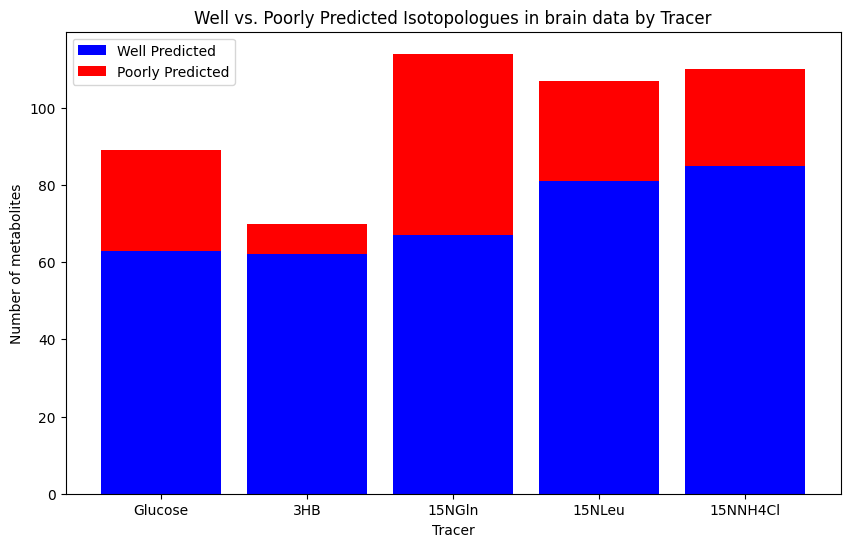

In [55]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
# Convert the data to a NumPy array for easier manipulation
data = np.array(results)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Create a bar for each tracer
width = 0.55
ind = np.arange(len(tracers))/1.5

# Create the lower bars (well-predicted)
p1 = ax.bar(ind, data[:, 0], width, label='Well Predicted', color='blue')
# Create the higher bars (poorly-predicted)
p2 = ax.bar(ind, data[:, 1], width, label='Poorly Predicted', color='red', bottom=data[:, 0])

# Add labels, title, and legend
ax.set_xlabel('Tracer')
ax.set_ylabel('Number of metabolites')
ax.set_title('Well vs. Poorly Predicted Isotopologues in brain data by Tracer')
ax.set_xticks(ind)
ax.set_xticklabels(["Glucose", "3HB", "15NGln", "15NLeu", "15NNH4Cl"])
ax.legend()

plt.show()